Importing Libraries

In [481]:
import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns

from datetime import timedelta
from pathlib import Path
from warnings import simplefilter

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from xgboost import XGBRegressor

In [482]:
plt.rcParams.update({'font.size': 14})

# Air Pollution Preparation & Visualization

In [483]:
#Import air pollution dataset
air_polution = pd.read_csv('./datasets/tno/air_pollution.csv', parse_dates=['date'])
air_polution_per_zipcode =  dict(tuple(air_polution.groupby('PC4')))

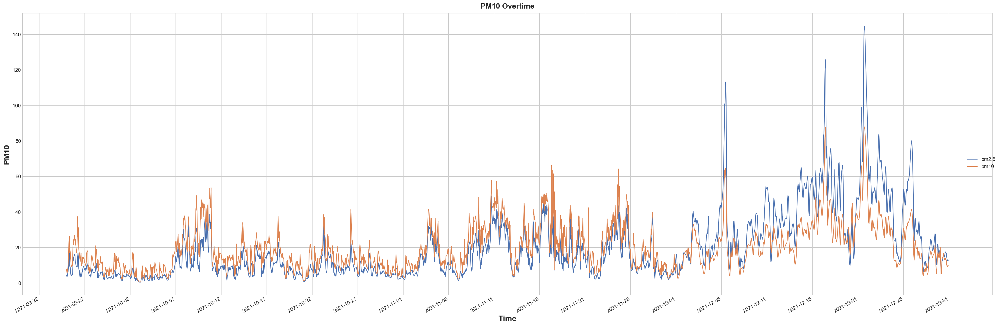

In [484]:
df = air_polution_per_zipcode[5612]
x1 = df.date.values
y1 = df['pm2.5'].values
y2 = df['pm10'].values
y3 = df['no'].values


fig, ax = plt.subplots(figsize=(30, 10))
l1 = ax.plot(x1, y1, label="pm2.5")
l2 = ax.plot(x1, y2, label="pm10")
# l3 = ax.plot(x1, y3, label="no")

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='right')

ax.xaxis.set_major_locator(dates.DayLocator(interval=5))
fig.autofmt_xdate()

plt.ylabel('PM10')
plt.xlabel('Time')
plt.title("PM10 Overtime")
plt.show()

In [485]:
df[df.date < "2021-10-1"]

,date,PC4,pm10,pm2.5,no2,no,so2
1608,2021-09-25 00:00:00,5612,7.864758,4.531495,26.565818,17.380828,2.309348
1609,2021-09-25 01:00:00,5612,5.563095,3.425978,16.819145,11.004015,2.149709
1610,2021-09-25 02:00:00,5612,6.333280,4.198472,17.503193,11.451557,1.985016
1611,2021-09-25 03:00:00,5612,7.906101,5.428337,17.364577,11.360867,2.035825
1612,2021-09-25 04:00:00,5612,10.083385,6.628572,17.365165,11.361251,2.248151
...,...,...,...,...,...,...,...
1747,2021-09-30 19:00:00,5612,10.587171,4.592200,27.730742,18.142986,1.781563
1748,2021-09-30 20:00:00,5612,9.410866,4.878185,22.289418,14.582970,2.195394
1749,2021-09-30 21:00:00,5612,8.968899,4.578824,20.936936,13.698102,2.208677
1750,2021-09-30 22:00:00,5612,6.190010,3.226873,15.584436,10.196200,1.871357


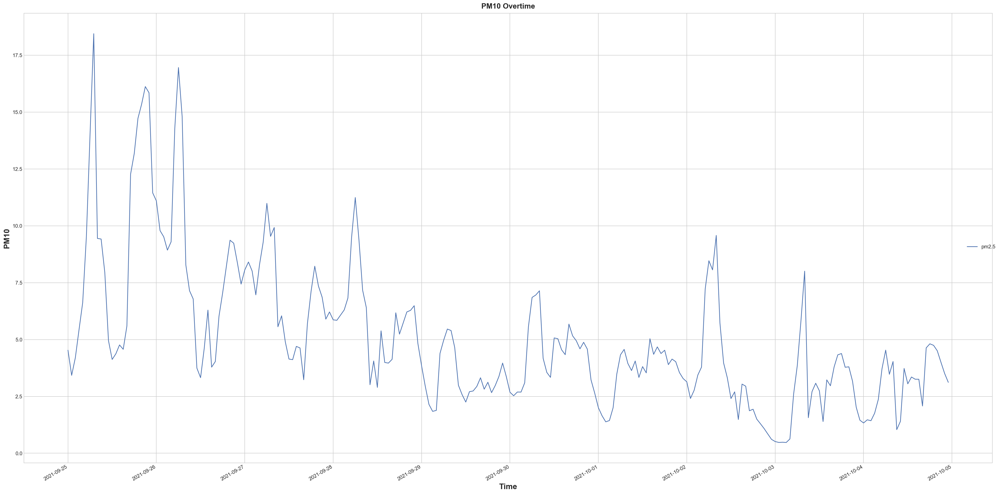

In [486]:
df = air_polution_per_zipcode[5612]
df = df[df.date < (df.date.min() + timedelta(days=10))]
x1 = df.date
y1 = df['pm2.5'].values
y2 = df['pm10'].values
y3 = df['no'].values


fig, ax = plt.subplots(figsize=(30, 15))
l1 = ax.plot(x1, y1, label="pm2.5")
# l2 = ax.plot(x1, y2, label="pm10")
# l3 = ax.plot(x1, y3, label="no")

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='right')

ax.xaxis.set_major_locator(dates.DayLocator(interval=1))
fig.autofmt_xdate()

plt.ylabel('PM10')
plt.xlabel('Time')
plt.title("PM10 Overtime")
plt.show()

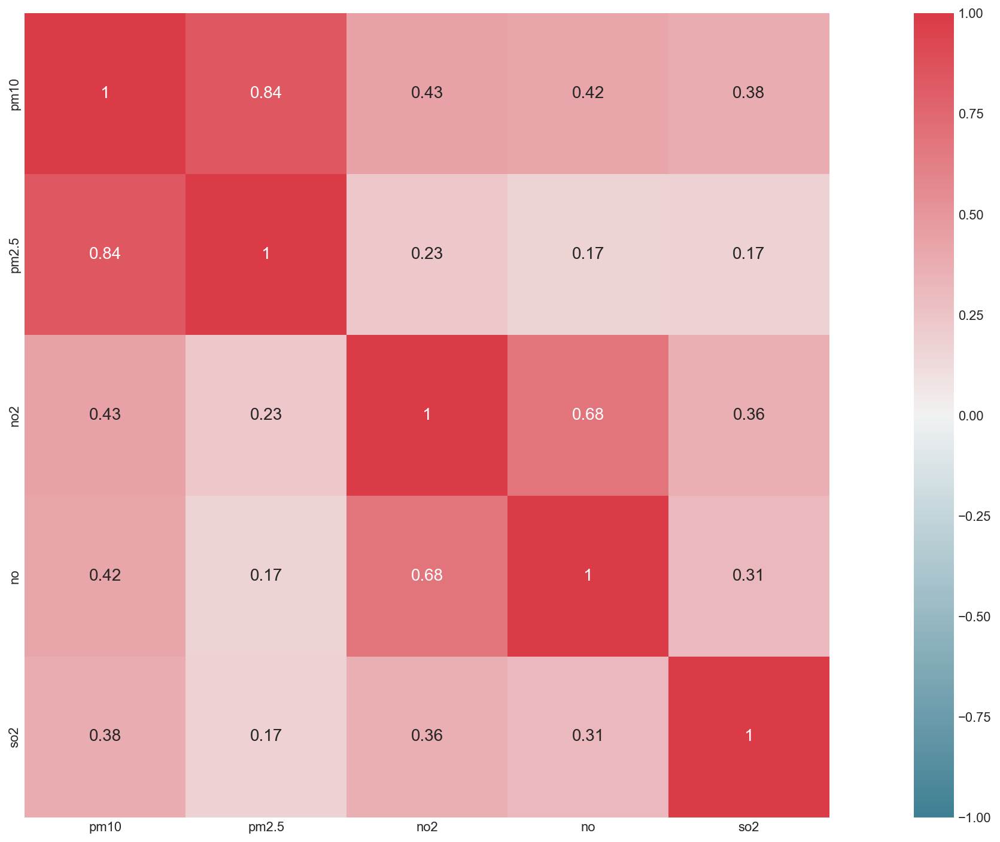

In [487]:
df = air_polution_per_zipcode[5612]
f, ax = plt.subplots(figsize=(20, 10))
corr = df[["pm10", "pm2.5", "no2", "no", "so2"]].corr()
sns.heatmap(corr, annot=True,
    cmap=sns.diverging_palette(220, 10, as_cmap=True),
    vmin=-1.0, vmax=1.0,
    square=True, ax=ax)
plt.show()

In [488]:
df = air_polution_per_zipcode[5612]
df = df.groupby('date').mean()
df['no_lag_1'] = df['no'].shift(1)
df['time'] = np.arange(len(df.index))

X = df['time'].to_frame()
y = df['no']

In [489]:
model = LinearRegression()
model.fit(X, y)
y_pred = pd.Series(model.predict(X), index=X.index)

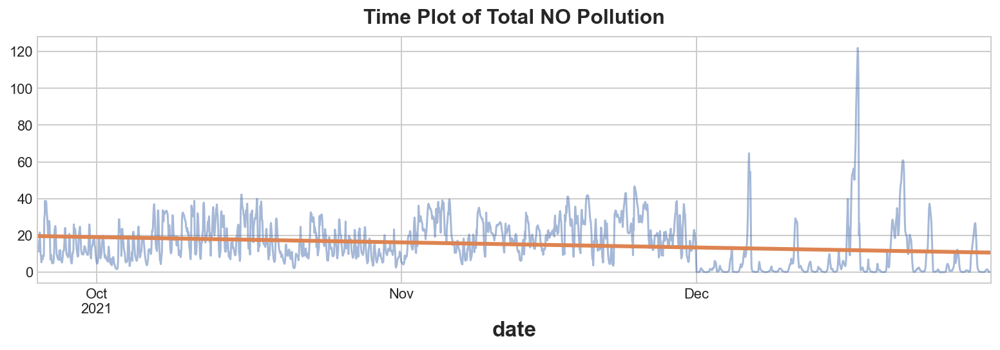

In [490]:
ax = y.plot(alpha=0.5)
ax = y_pred.plot(ax=ax, linewidth=3)
ax.set_title('Time Plot of Total NO Pollution');

In [491]:
df = air_polution_per_zipcode[5612]
df = df.groupby('date').mean()
df['no_lag_1'] = df['no'].shift(1)
# df['time'] = np.arange(len(df.index))

X = df['no_lag_1'].to_frame()
X = X.bfill()
y = df['no']
y, X = y.align(X, join='inner')

model = LinearRegression()
model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)

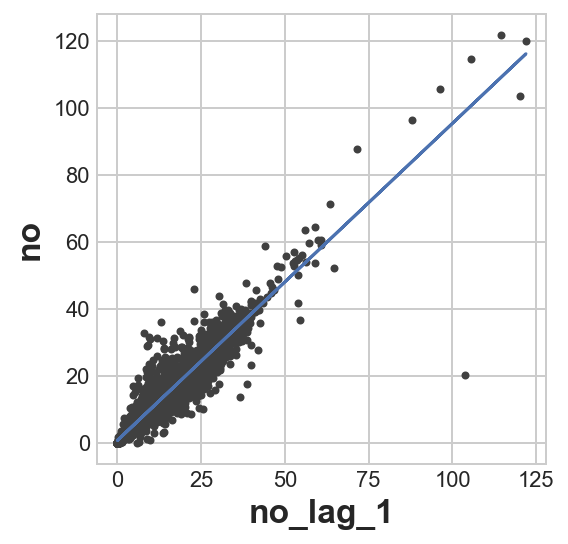

In [492]:
fig, ax = plt.subplots()
ax.plot(X['no_lag_1'], y, '.', color='0.25')
ax.plot(X['no_lag_1'], y_pred)
ax.set(aspect='equal', ylabel='no', xlabel='no_lag_1');

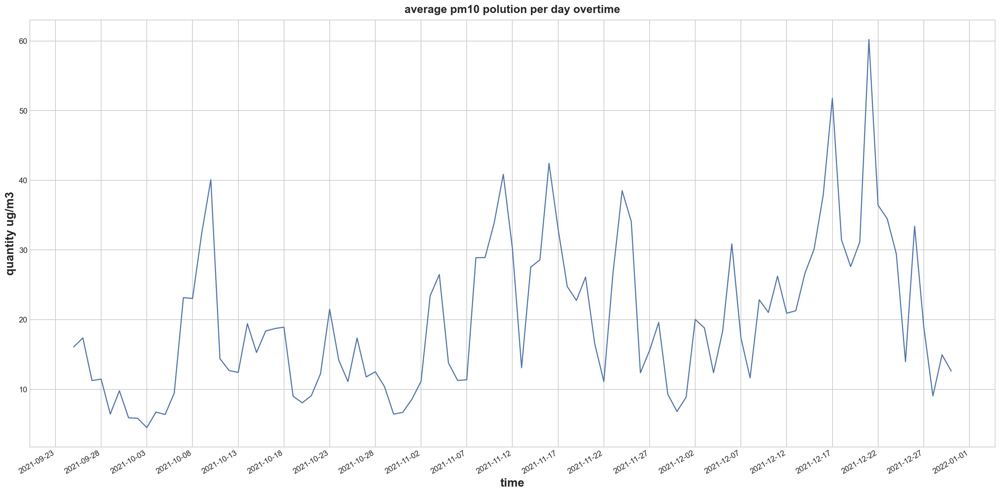

In [493]:
df = air_polution_per_zipcode[5611]
df_perday = df.groupby(pd.Grouper(key="date", freq="D")).mean()

x = df_perday.index
y = df_perday.pm10

fig, ax = plt.subplots(figsize=(20,10))
ax.plot(x, y)
ax.xaxis.set_major_locator(dates.DayLocator(interval=5))
fig.autofmt_xdate()

plt.title("average pm10 polution per day overtime")
plt.ylabel('quantity ug/m3')
plt.xlabel('time')
plt.show()

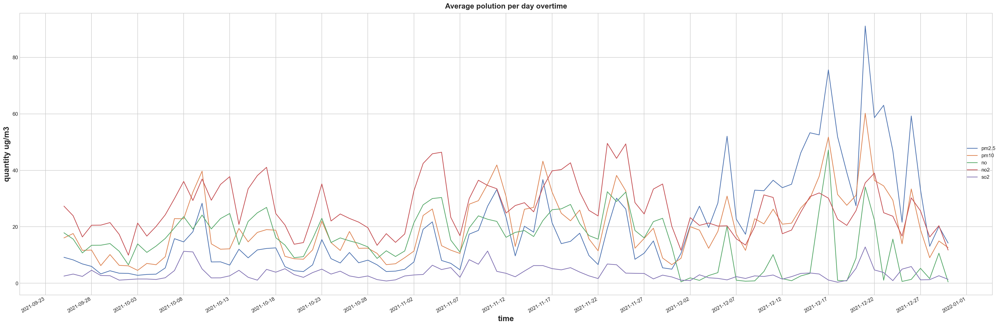

In [494]:
df = air_polution_per_zipcode[5612]
df = df.groupby(pd.Grouper(key="date", freq="D")).mean()

x1 = df.index
y1 = df['pm2.5'].values
y2 = df['pm10'].values
y3 = df['no'].values
y4 = df['no2'].values
y5 = df['so2'].values


fig, ax = plt.subplots(figsize=(30, 10))
l1 = ax.plot(x1, y1, label="pm2.5")
l2 = ax.plot(x1, y2, label="pm10")
l3 = ax.plot(x1, y3, label="no")
l4 = ax.plot(x1, y4, label="no2")
l5 = ax.plot(x1, y5, label="so2")

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='right')

ax.xaxis.set_major_locator(dates.DayLocator(interval=5))
fig.autofmt_xdate()

plt.title("Average polution per day overtime")
plt.ylabel('quantity ug/m3')
plt.xlabel('time')
plt.show()

In [495]:
df = air_polution_per_zipcode[5612]
df[["pm10", "pm2.5", "no2", "no", "so2"]] = df[["pm10", "pm2.5", "no2", "no", "so2"]].apply(round)

(array([16.,  2.,  1.,  1.,  0.,  1.,  1.,  0.,  1.,  1.]),
 array([  1. ,  53.3, 105.6, 157.9, 210.2, 262.5, 314.8, 367.1, 419.4,
        471.7, 524. ]),
 <BarContainer object of 10 artists>)

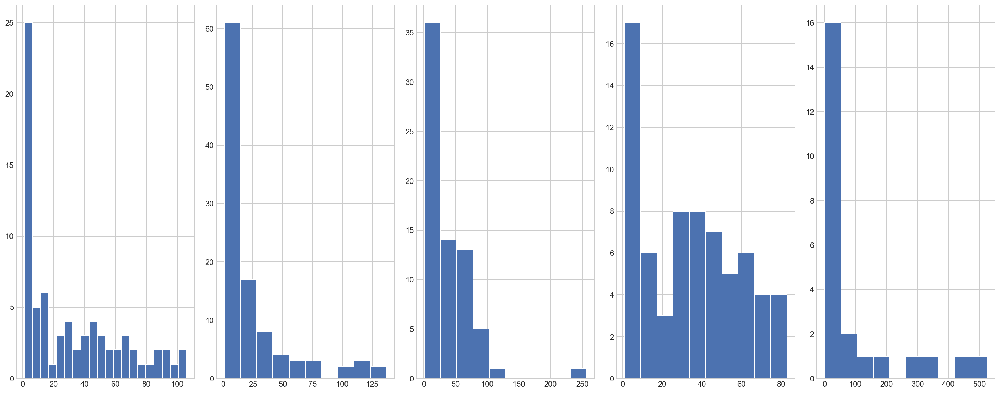

In [496]:
df.groupby(['pm10']).size()
df.groupby(['pm2.5']).size()
df.groupby(['no']).size()
df.groupby(['no2']).size()
df.groupby(['so2']).size()

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(20, 8))

ax1.hist(df.groupby(['pm10']).size(), bins=20)
ax2.hist(df.groupby(['pm2.5']).size())
ax3.hist(df.groupby(['no']).size())
ax4.hist(df.groupby(['no2']).size())
ax5.hist(df.groupby(['so2']).size())

### Conclusion

# Meteorology Preparation & Visualization

In [497]:
#Import Meteorology dataset
meteo = pd.read_csv('./datasets/tno/meteo.csv', parse_dates=['date'])

In [498]:
meteo["date"] = pd.to_datetime(meteo["date"])
meteo_per_zipcode = dict(tuple(meteo.groupby('PC4')))

In [499]:
df1 = meteo_per_zipcode[5611]
df2 = meteo_per_zipcode[5612]
df3 = meteo_per_zipcode[5613]

### Solar Surface Radiation

Text(0.5, 0.98, 'Solar Surface Radiation Downwards(SSRD)')

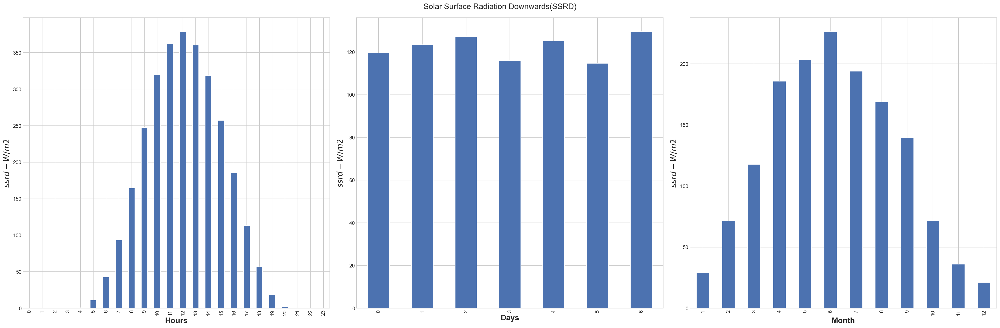

In [500]:
fig, (ax1, ax2, ax4) = plt.subplots(1, 3, figsize=(30, 10))
df1.groupby(df1["date"].dt.hour)["ssrd"].mean().plot(kind='bar', ax=ax1)
df1.groupby(df1["date"].dt.weekday)["ssrd"].mean().plot(kind='bar', ax=ax2)
df1.groupby(df1["date"].dt.month)["ssrd"].mean().plot(kind='bar', ax=ax4)

ax1.set_xlabel("Hours")
ax2.set_xlabel("Days")
ax4.set_xlabel("Month")

ax1.set_ylabel("$ssrd-W/m2$")
ax2.set_ylabel("$ssrd-W/m2$")
ax4.set_ylabel("$ssrd-W/m2$")

fig.suptitle("Solar Surface Radiation Downwards(SSRD)")

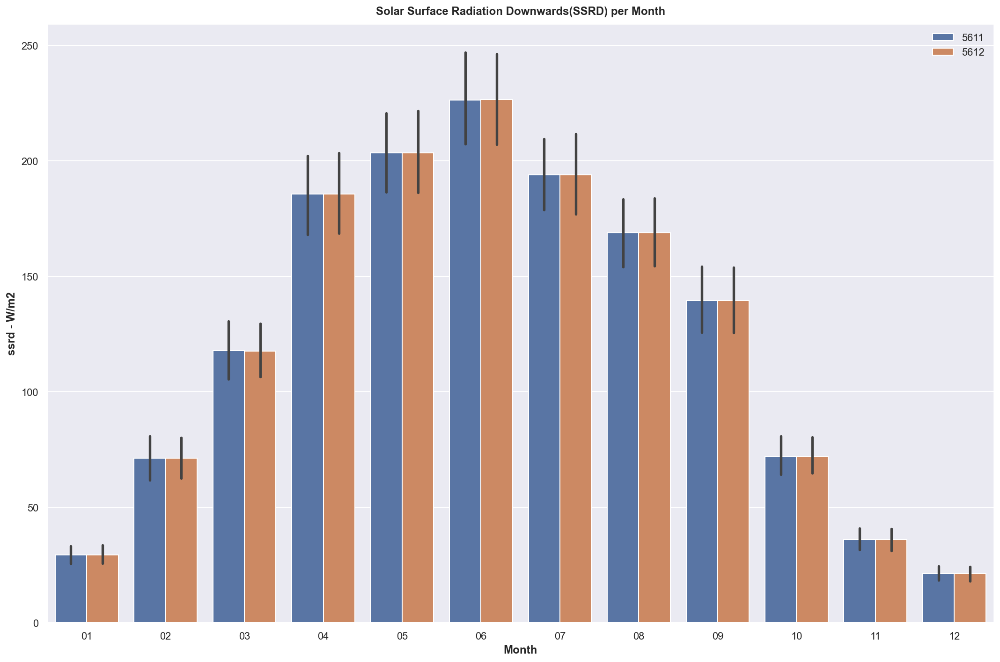

In [501]:
df1['month'] = df1['date'].map(lambda dt: dt.strftime('%m'))
df2['month'] = df2['date'].map(lambda dt: dt.strftime('%m'))

plotdf1=pd.DataFrame({'x':df1["month"],'y':df1["ssrd"]})
plotdf2=pd.DataFrame({'x':df2["month"],'y':df2["ssrd"]})
plotdf1['hue']=5611
plotdf2['hue']=5612
res=pd.concat([plotdf1,plotdf2])

sns.set(rc = {'figure.figsize':(15,10)})
sns.barplot(x='x',y='y',data=res,hue='hue')
plt.title("Solar Surface Radiation Downwards(SSRD) per Month")
plt.xlabel('Month')
plt.ylabel('ssrd - W/m2')
plt.legend(loc='upper right')
plt.show()

Text(0.5, 1.0, 'Solar Surface Radiation Downwards(SSRD) per Month')

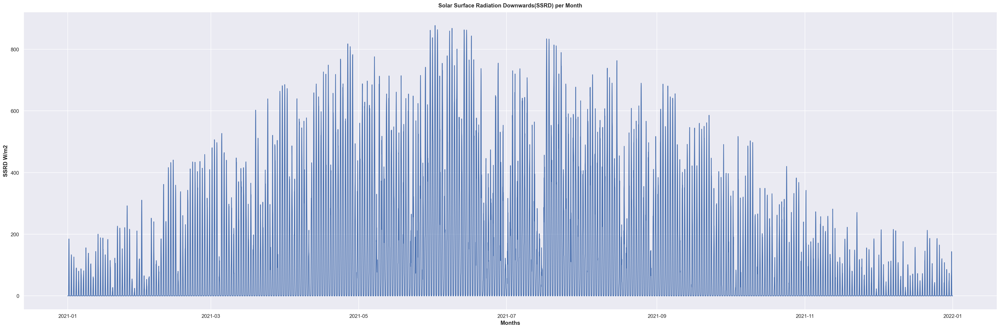

In [502]:
x = df1["date"].values
y = df1["ssrd"].values

fig, ax = plt.subplots(figsize=(30, 10))
l1 = ax.plot(x, y)

plt.xlabel("Months")
plt.ylabel("SSRD W/m2")
plt.title("Solar Surface Radiation Downwards(SSRD) per Month")

In [503]:
zip1 = meteo_per_zipcode[5611]
zip2 = meteo_per_zipcode[5612]

### Boundary Layer Height

Text(0.5, 0.98, 'Boundary Layer Height (BLH)')

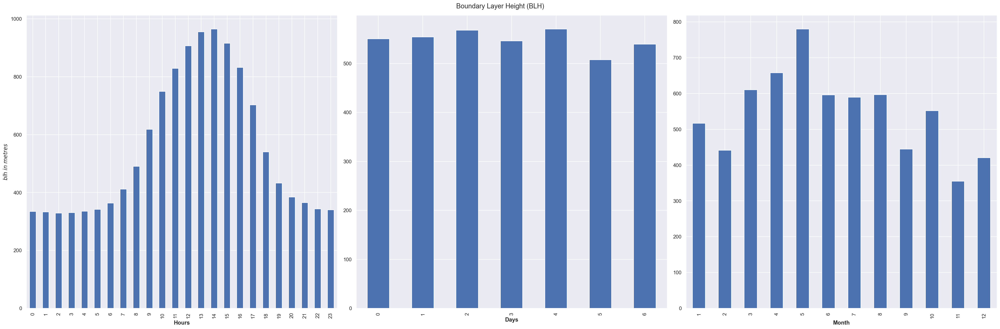

In [504]:
fig, (ax1, ax2, ax4) = plt.subplots(1, 3, figsize=(30, 10))
zip2.groupby(zip2["date"].dt.hour)["blh"].mean().plot(kind='bar', ax=ax1)
zip2.groupby(zip2["date"].dt.weekday)["blh"].mean().plot(kind='bar', ax=ax2)
zip2.groupby(zip2["date"].dt.month)["blh"].mean().plot(kind='bar', ax=ax4)

ax1.set_xlabel("Hours")
ax2.set_xlabel("Days")
ax4.set_xlabel("Month")

ax1.set_ylabel("$blh$ $in$ $metres$")

fig.suptitle("Boundary Layer Height (BLH)")

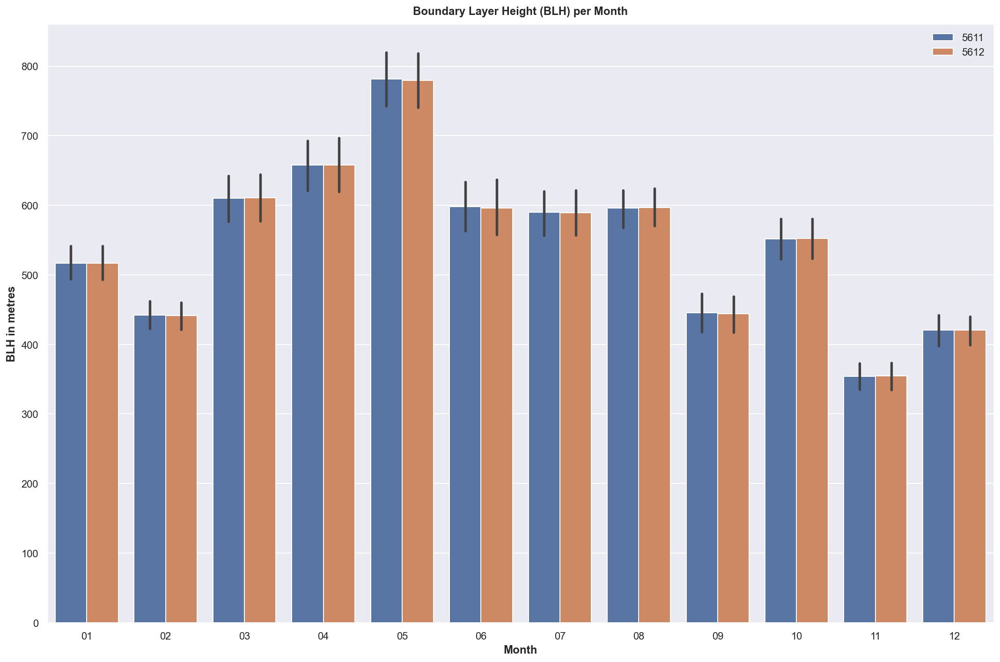

In [505]:
df1['month'] = zip1['date'].map(lambda dt: dt.strftime('%m'))
df2['month'] = zip2['date'].map(lambda dt: dt.strftime('%m'))

plotdf1=pd.DataFrame({'x':df1["month"],'y':df1["blh"]})
plotdf2=pd.DataFrame({'x':df2["month"],'y':df2["blh"]})
plotdf1['hue']=5611
plotdf2['hue']=5612
res=pd.concat([plotdf1,plotdf2])

sns.set(rc = {'figure.figsize':(15,10)})
sns.barplot(x='x',y='y',data=res,hue='hue')
plt.title("Boundary Layer Height (BLH) per Month")
plt.xlabel('Month')
plt.ylabel('BLH in metres')
plt.legend(loc='upper right')
plt.show()

Text(0.5, 1.0, 'Boundary Layer Height(BLH) for a Year')

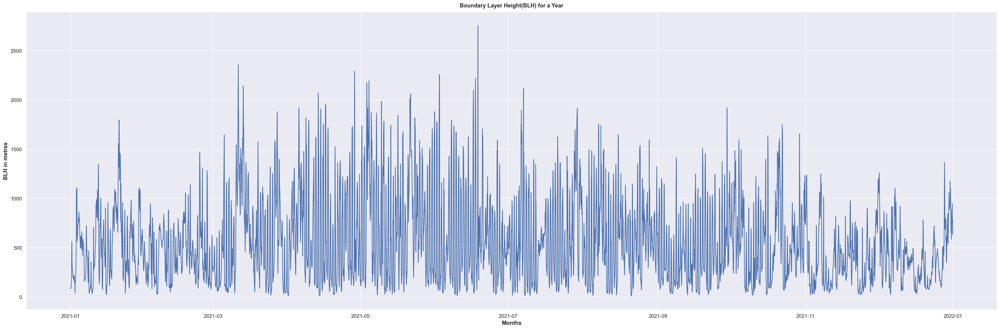

In [506]:
x = zip1["date"].values
y = zip1["blh"].values

fig, ax = plt.subplots(figsize=(30, 10))
l1 = ax.plot(x, y)

plt.xlabel("Months")
plt.ylabel("BLH in metres")
plt.title("Boundary Layer Height(BLH) for a Year")

### Total Cloud Coverage

Text(0.5, 0.98, 'Total Cloud Coverage (TCC)')

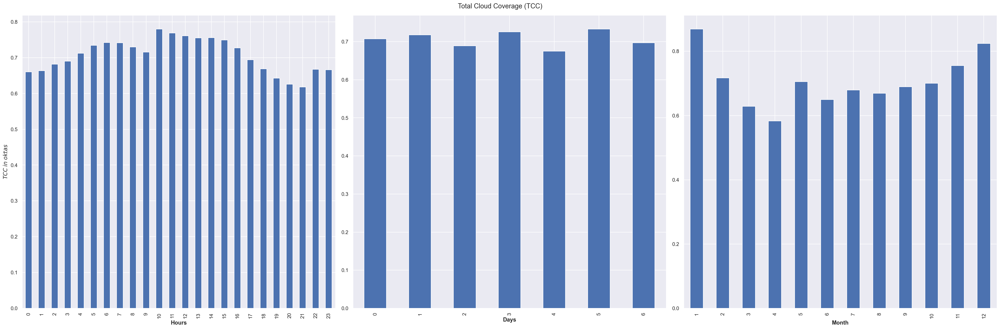

In [507]:
fig, (ax1, ax2, ax4) = plt.subplots(1, 3, figsize=(30, 10))
zip2.groupby(zip2["date"].dt.hour)["tcc"].mean().plot(kind='bar', ax=ax1)
zip2.groupby(zip2["date"].dt.weekday)["tcc"].mean().plot(kind='bar', ax=ax2)
zip2.groupby(zip2["date"].dt.month)["tcc"].mean().plot(kind='bar', ax=ax4)

ax1.set_xlabel("Hours")
ax2.set_xlabel("Days")
ax4.set_xlabel("Month")

ax1.set_ylabel("$TCC$ $in$ $oktas$")

fig.suptitle("Total Cloud Coverage (TCC)")

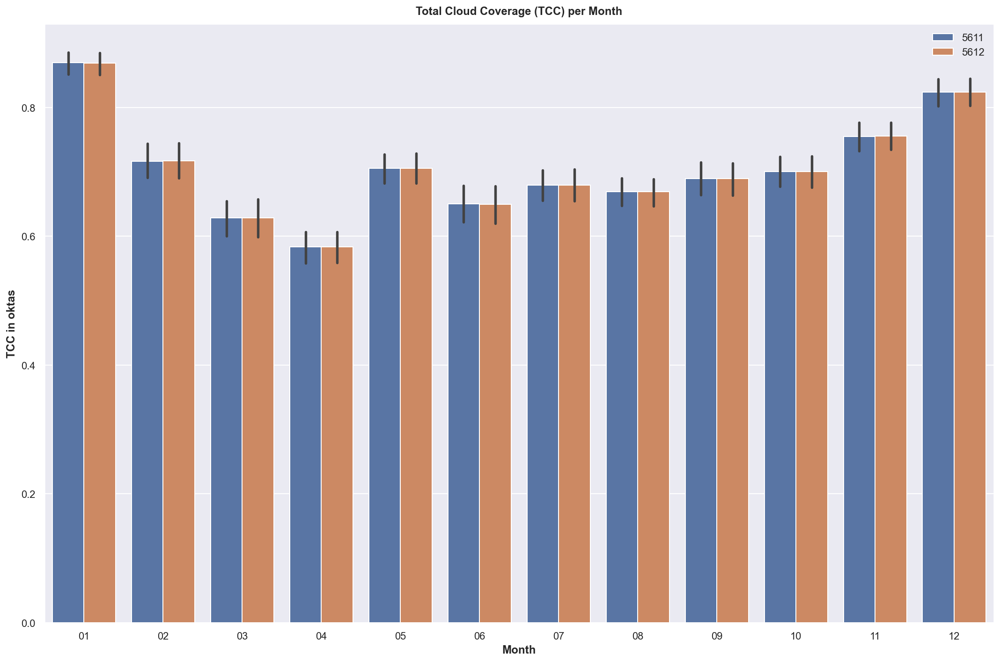

In [508]:
df1['month'] = zip1['date'].map(lambda dt: dt.strftime('%m'))
df2['month'] = zip2['date'].map(lambda dt: dt.strftime('%m'))

plotdf1=pd.DataFrame({'x':df1["month"],'y':df1["tcc"]})
plotdf2=pd.DataFrame({'x':df2["month"],'y':df2["tcc"]})
plotdf1['hue']=5611
plotdf2['hue']=5612
res=pd.concat([plotdf1,plotdf2])

sns.set(rc = {'figure.figsize':(15,10)})
sns.barplot(x='x',y='y',data=res,hue='hue')
plt.title("Total Cloud Coverage (TCC) per Month")
plt.xlabel('Month')
plt.ylabel('TCC in oktas')
plt.legend(loc='upper right')
plt.show()

Text(0.5, 1.0, 'Total Cloud Coverage (TCC) for a Year')

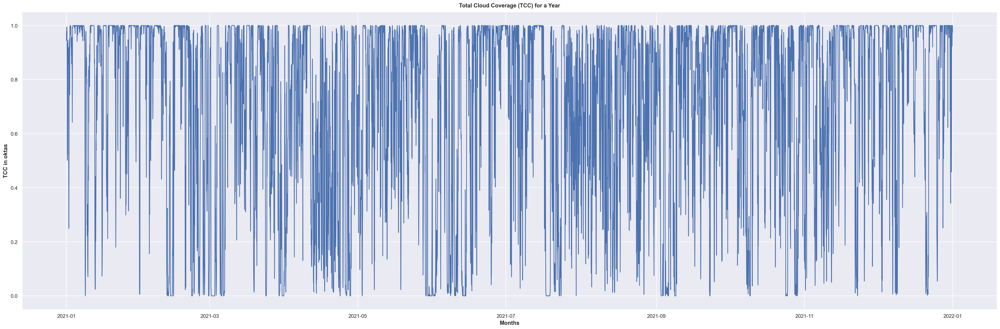

In [509]:
x = zip1["date"].values
y = zip1["tcc"].values

fig, ax = plt.subplots(figsize=(30, 10))
l1 = ax.plot(x, y)

plt.xlabel("Months")
plt.ylabel("TCC in oktas")
plt.title("Total Cloud Coverage (TCC) for a Year")

### Conclusion

In conclusion, while visualizing the meteorology data, there was some research done on what impact the different topics have on the pollutants.
For example, if the boundary layer heaight(BLH) is low there will be a higher concentration of pollutants, and if it is high the pollutants are less concentrated because they are more dispersed.
The total cloud coverage plays the most role towards this, because it affects the BLH as well as the amount of solar surface radiation downwards(ssrd).

# Population Preparation & Visualization

In [510]:
#Import population dataset
zichtop = pd.read_csv('./datasets/tno/zichtop.csv', parse_dates=['date'])
zichtop_per_zipcode = dict(tuple(zichtop.groupby('PC4')))

In [511]:
df_zipcode = zichtop_per_zipcode[5611]
df_zipcode["date"]=pd.to_datetime(df_zipcode["date"])
df_zipcode["date"].min(), df_zipcode["date"].max()

(Timestamp('2021-01-01 00:00:00'), Timestamp('2021-11-18 23:00:00'))

Average total fractional population 

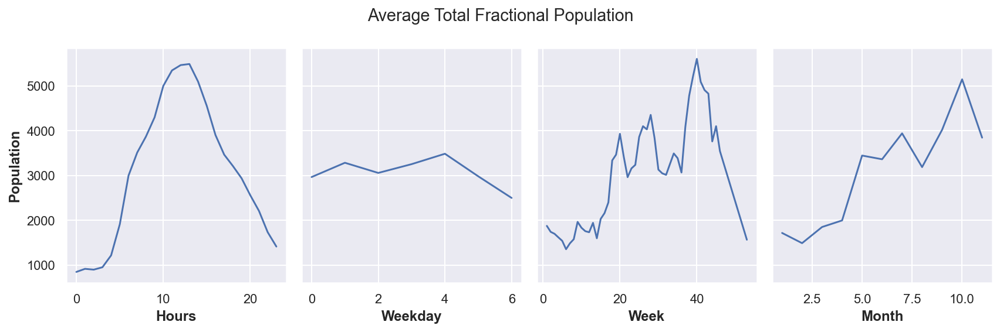

In [512]:
fig, (ax1, ax2, ax3, ax4)= plt.subplots(1,4, figsize=(12, 4), sharey=True)

df_zipcode.groupby(df_zipcode["date"].dt.hour)["pop_tot"].mean().plot(kind='line', ax=ax1)
df_zipcode.groupby(df_zipcode["date"].dt.weekday)["pop_tot"].mean().plot(kind='line', ax=ax2)
df_zipcode.groupby(df_zipcode["date"].dt.isocalendar().week)["pop_tot"].mean().plot(kind='line', ax=ax3)
df_zipcode.groupby(df_zipcode["date"].dt.month)["pop_tot"].mean().plot(kind='line', ax=ax4)

ax1.set_xlabel("Hours")
ax2.set_xlabel("Weekday")
ax3.set_xlabel("Week")
ax4.set_xlabel("Month")

ax1.set_ylabel('Population')

fig.suptitle("Average Total Fractional Population")
plt.show()

In [513]:
df_zipcode['date_split'] = pd.to_datetime(df_zipcode['date']).dt.date
df_zipcode['time_split_hours'] = pd.to_datetime(df_zipcode['date']).dt.time

df_zipcode["date_split"]=pd.to_datetime(df_zipcode["date_split"])
df_zipcode["time_split_hours"]=df_zipcode["time_split_hours"].map(lambda dt: dt.strftime("%H"))
df_zipcode

,PC4,date,pop_tot,m00_30,m30_60,H1_2,H2_4,H4_8,H8_16,H16plus,date_split,time_split_hours
0,5611,2021-01-01 00:00:00,830,136.0,80.0,34.0,57.0,34.0,34.0,455.0,2021-01-01,00
1,5611,2021-01-01 01:00:00,837,138.0,11.0,23.0,92.0,23.0,80.0,470.0,2021-01-01,01
2,5611,2021-01-01 02:00:00,745,41.0,0.0,0.0,82.0,51.0,71.0,500.0,2021-01-01,02
3,5611,2021-01-01 03:00:00,876,115.0,0.0,0.0,52.0,21.0,125.0,563.0,2021-01-01,03
4,5611,2021-01-01 04:00:00,714,49.0,0.0,0.0,37.0,25.0,111.0,492.0,2021-01-01,04
...,...,...,...,...,...,...,...,...,...,...,...,...
7723,5611,2021-11-18 19:00:00,3265,326.0,58.0,105.0,548.0,501.0,571.0,1156.0,2021-11-18,19
7724,5611,2021-11-18 20:00:00,2829,132.0,72.0,72.0,385.0,409.0,494.0,1265.0,2021-11-18,20
7725,5611,2021-11-18 21:00:00,2352,235.0,13.0,65.0,183.0,209.0,327.0,1320.0,2021-11-18,21
7726,5611,2021-11-18 22:00:00,1792,52.0,10.0,52.0,42.0,198.0,260.0,1178.0,2021-11-18,22


Hourly average population on a specific date

In [514]:
day = "2021-11-08"

df_daily = df_zipcode[(df_zipcode['date_split'] == day)] #.reset_index()

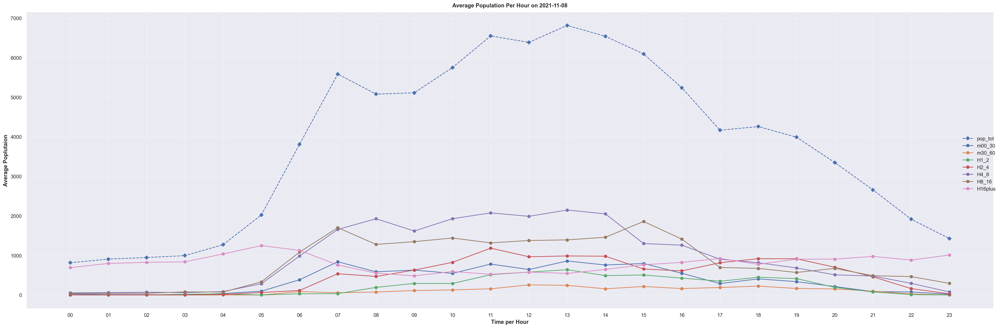

In [515]:
x1 = df_daily['time_split_hours'].values
y1 = df_daily['pop_tot'].values
y2 = df_daily['m00_30'].values
y3 = df_daily['m30_60'].values
y4 = df_daily['H1_2'].values
y5 = df_daily['H2_4'].values
y6 = df_daily['H4_8'].values
y7 = df_daily['H8_16'].values
y8 = df_daily['H16plus'].values


fig, ax = plt.subplots(figsize=(30, 10))
l1 = ax.plot(x1, y1, '--Db', label="pop_tot")
l2 = ax.plot(x1, y2, '-o', label="m00_30")
l3 = ax.plot(x1, y3, '-o', label="m30_60")
l4 = ax.plot(x1, y4, '-o', label="H1_2")
l5 = ax.plot(x1, y5, '-o', label="H2_4")
l6 = ax.plot(x1, y6, '-o', label="H4_8")
l7 = ax.plot(x1, y7, '-o', label="H8_16")
l8 = ax.plot(x1, y8, '-o', label="H16plus")

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='right')

plt.ylabel('Average Poplutaion')
plt.xlabel('Time per Hour')
plt.title("Average Population Per Hour on " + day)
plt.grid(linestyle = '--', linewidth = 0.5)
plt.show()

Use linear regression model to plot total population

In [516]:
df = zichtop_per_zipcode[5611]
df = df.groupby('date').mean()
df['pop_tot_lag_1'] = df['pop_tot'].shift(1)
df['time'] = np.arange(len(df.index))

X = df['time'].to_frame()
y = df['pop_tot']

/var/folders/7k/8v9qq9hd6kq6pt_9jy96nn6m0000gn/T/ipykernel_13733/1736820657.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby('date').mean()


In [517]:
model = LinearRegression()
model.fit(X, y)
y_pred = pd.Series(model.predict(X), index=X.index)

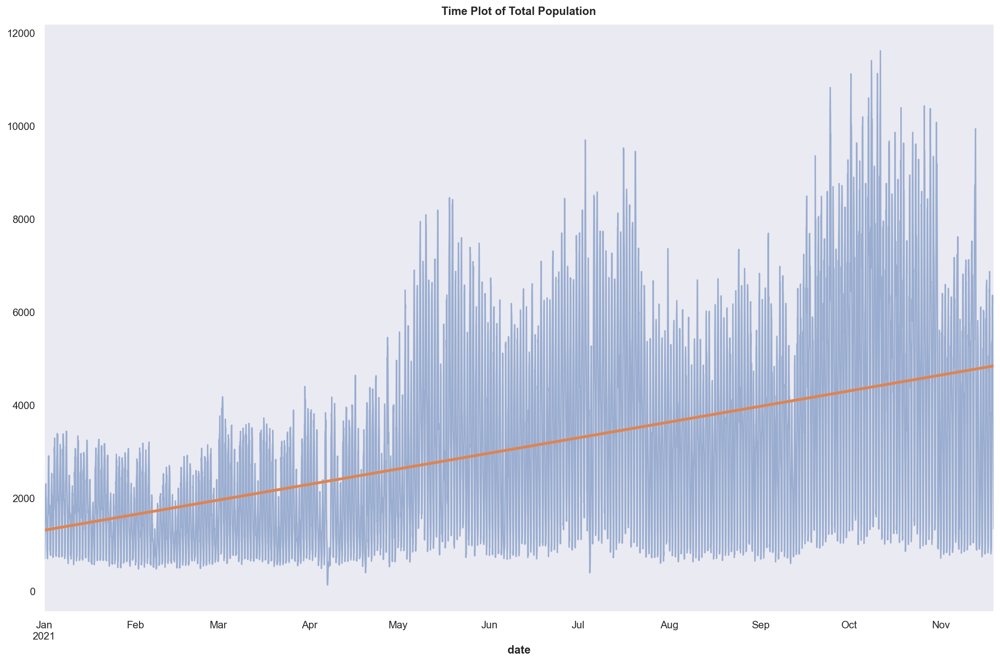

In [518]:
ax = y.plot(alpha=0.5)
ax = y_pred.plot(ax=ax, linewidth=3)
ax.set_title('Time Plot of Total Population')
plt.grid()

In [519]:
df = zichtop_per_zipcode[5611]
df = df.groupby('date').mean()
df['pop_tot_lag_1'] = df['pop_tot'].shift(1)
df['time'] = np.arange(len(df.index))

X = df['pop_tot_lag_1'].to_frame()
X = X.bfill()
y = df['pop_tot']
y, X = y.align(X, join='inner')

model = LinearRegression()
model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)

/var/folders/7k/8v9qq9hd6kq6pt_9jy96nn6m0000gn/T/ipykernel_13733/3014816592.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby('date').mean()


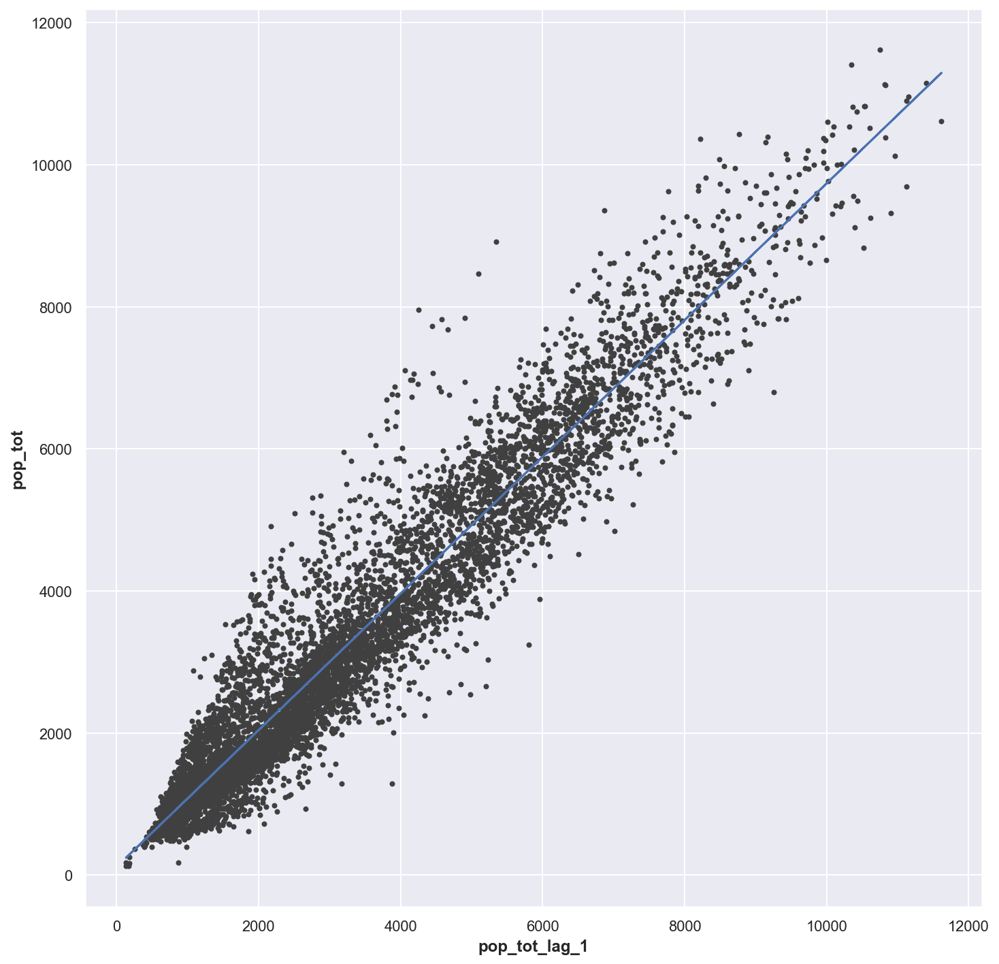

In [520]:
fig, ax = plt.subplots()
ax.plot(X['pop_tot_lag_1'], y, '.', color='0.25')
ax.plot(X['pop_tot_lag_1'], y_pred)
ax.set(aspect='equal', ylabel='pop_tot', xlabel='pop_tot_lag_1');

### Conclusion

According to this data, the population increases from January onwards. It could be due to seasonal changes. Coldest time in the yearcould result in less movement of people, therefore, it would have the population of people who must migrate to work, etc. With this, the ending of year is around Thanksgiving and Christmas. Therefore, more people will move around especially for something like gifts. These are just a few examples as to why it is possible to have the population increase from January to November.

### Merging TNO/Zicht OP Datasets

In [521]:
df1 = air_polution
df2 = meteo
df3 = zichtop

df = pd.merge(df1, df2, on=['date', 'PC4'])
df = pd.merge(df, df3, on=['date', 'PC4'])

In [522]:
df.to_csv('./datasets/others/merge-date.csv', index=False)

### Air Pollutants Distribution
Used merged dataset to check for outliers within the data and to make comparisons between the different types of areas.

In [523]:
df_read = pd.read_csv('./datasets/others/merge-date.csv')
df_read_per_zipcode = dict(tuple(df_read.groupby('PC4')))

In [524]:
#Postal codes for different areas

#City Center
df_pc1 = df_read_per_zipcode[5611] 

#Industrial Area
df_pc2 = df_read_per_zipcode[5651]

#Residential Area
df_pc3 = df_read_per_zipcode[5654]

Boxplots

Text(0.5, 1.0, 'Pollutants Distribution')

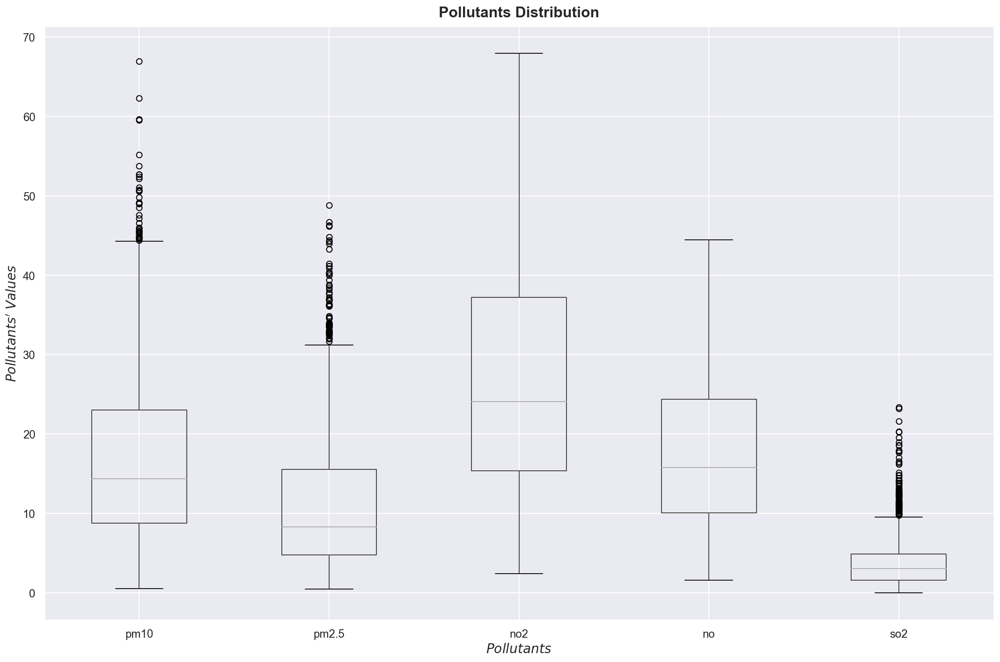

In [525]:
bxplt = df_pc1.boxplot(column=['pm10', 'pm2.5', 'no2', 'no','so2'], figsize=(15,10), fontsize=12)

bxplt.set_xlabel('$Pollutants$', fontsize = 14)
bxplt.set_ylabel('$Pollutants\'\ Values$', fontsize = 14)
bxplt.set_title('Pollutants Distribution', fontsize = 16)

Text(0.5, 1.0, 'Pollutants Distribution')

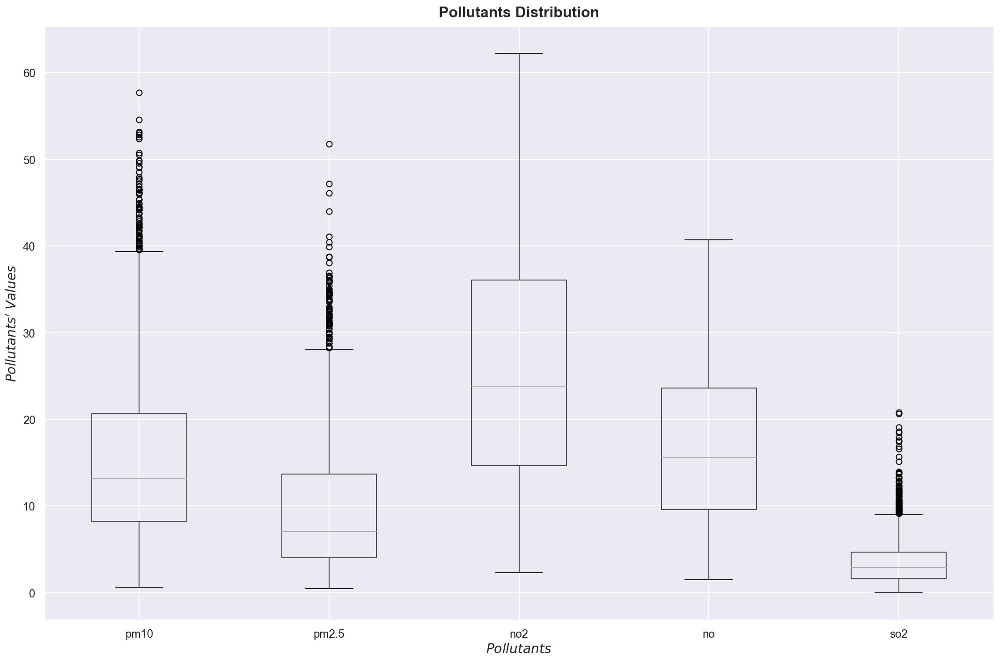

In [526]:
bxplt = df_pc2.boxplot(column=['pm10', 'pm2.5', 'no2', 'no','so2'], figsize=(15,10), fontsize=12)

bxplt.set_xlabel('$Pollutants$', fontsize = 14)
bxplt.set_ylabel('$Pollutants\'\ Values$', fontsize = 14)
bxplt.set_title('Pollutants Distribution', fontsize = 16)

Text(0.5, 1.0, 'Pollutants Distribution')

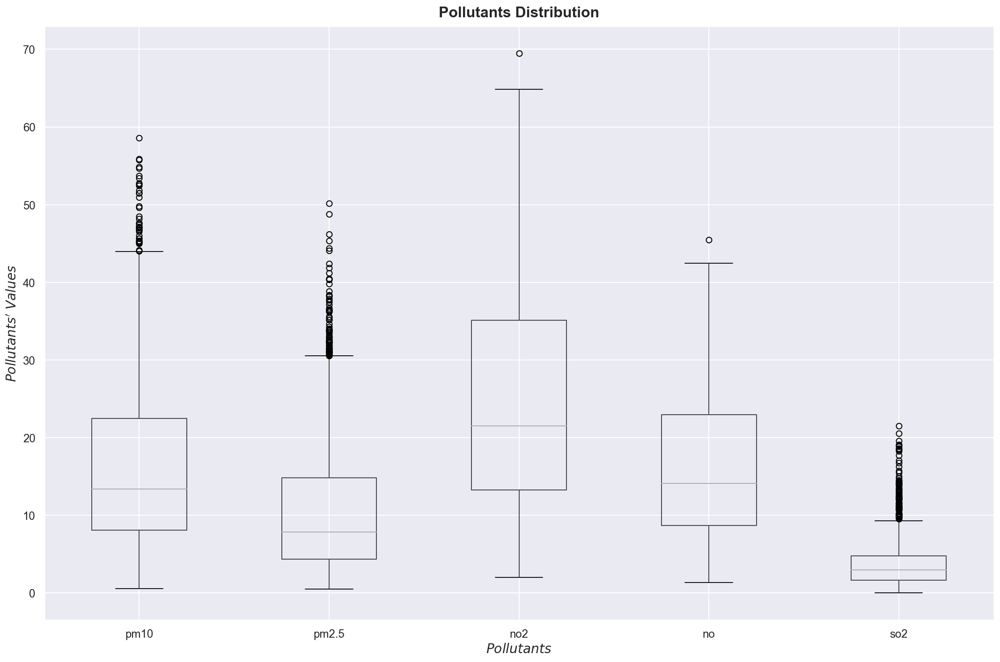

In [527]:
bxplt = df_pc3.boxplot(column=['pm10', 'pm2.5', 'no2', 'no','so2'], figsize=(15,10), fontsize=12)

bxplt.set_xlabel('$Pollutants$', fontsize = 14)
bxplt.set_ylabel('$Pollutants\'\ Values$', fontsize = 14)
bxplt.set_title('Pollutants Distribution', fontsize = 16)

Boxplot Conclusion

The 3 boxplots show the distribution of the pollutants. This can used to compare the amount of different levels of pollutants to the different postal codes. As the diagrams show, there are some outputs that can be outliers, but this can also be because of certain weatther conditions such as the boundary layer height being at a low level, so there was a higher concentration of pollutants.

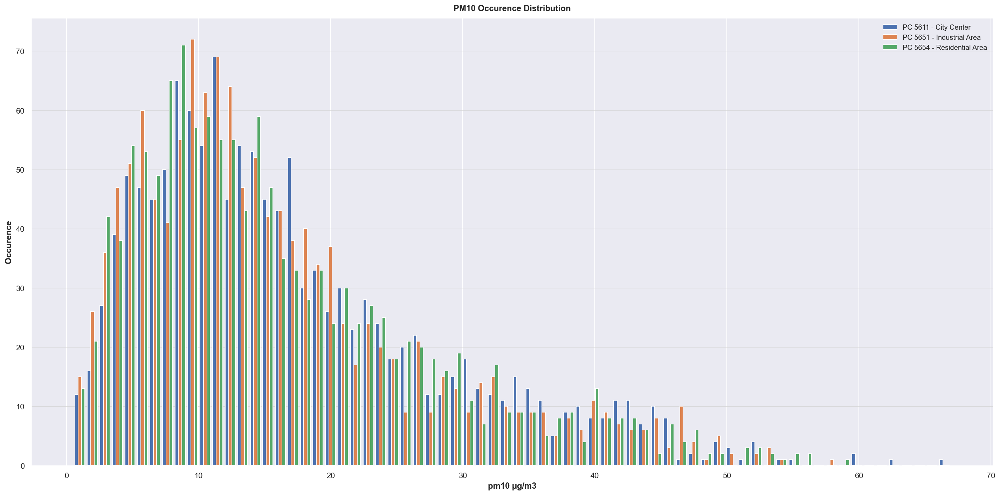

In [528]:
x = [df_pc1['pm10'], df_pc2['pm10'], df_pc3['pm10']]
plt.ylabel('Occurence')
plt.xlabel('pm10 µg/m3')
plt.title("PM10 Occurence Distribution")

plt.hist(x, bins=70, label=['PC 5611 - City Center', 'PC 5651 - Industrial Area','PC 5654 - Residential Area'])
plt.gcf().set_size_inches(20, 10)
plt.legend(prop={'size': 10})
plt.grid(axis = 'y',color = 'lightgrey', linewidth = 0.5)
plt.show()

### Conclusion

This diagram shows the comparison of the pm10 pollutant in a the city center, industrial and residential area. This is to determine a comparison as well as if there are any outliers within the data. According to this data, there aren't major outliers. The few that are between 60 and 70 could be due to other factors such as the weather.

Therefore, it can be concluded that all the data for these 3 postal codes are relavant in use of training the model.

# Mixing with Eindhoven Open Dataset

In [529]:
#Load datasets
charging_station_gdf = gpd.read_file('./datasets/researched/charging-station.geojson')
parking_spot_gdf = gpd.read_file('./datasets/researched/parking-spot.geojson')
zipcode_area_gdf = gpd.read_file('./datasets/researched/eindhoven-zipcode.geojson')
trees_gdf = gpd.read_file('./datasets/researched/trees.geojson')
green_areas_gdf = gpd.read_file('./datasets/researched/green-areas.geojson')
zipcode_area_gdf = gpd.read_file('./datasets/researched/eindhoven-zipcode.geojson')

Update the CRS to follow Cartesian system (EPSG:3857, unit=m)
(save the calculated area per postcode in km2)

In [530]:
zipcode_area_gdf = zipcode_area_gdf.to_crs(3857)
zipcode_area_gdf['area'] = zipcode_area_gdf.area / 10**6

charging_station_gdf = charging_station_gdf.to_crs(3857)
parking_spot_gdf = parking_spot_gdf.to_crs(3857)
trees_gdf = trees_gdf.to_crs(3857)
green_areas_gdf = green_areas_gdf.to_crs(3857)

Size comparison between each postal code

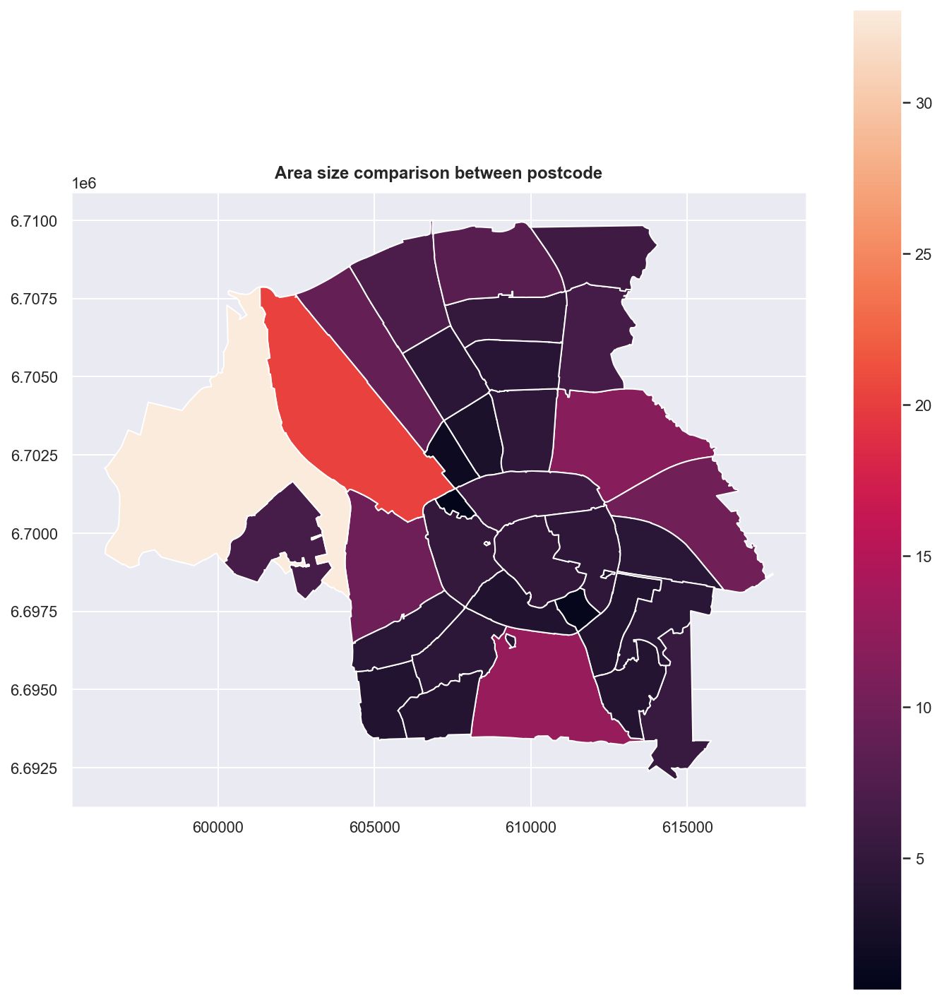

In [531]:
fig, ax = plt.subplots(figsize=(10, 10))

zipcode_area_gdf.plot("area", legend=True, ax=ax)

plt.title("Area size comparison between postcode")
plt.show()

Distribution of charging station in each postcode

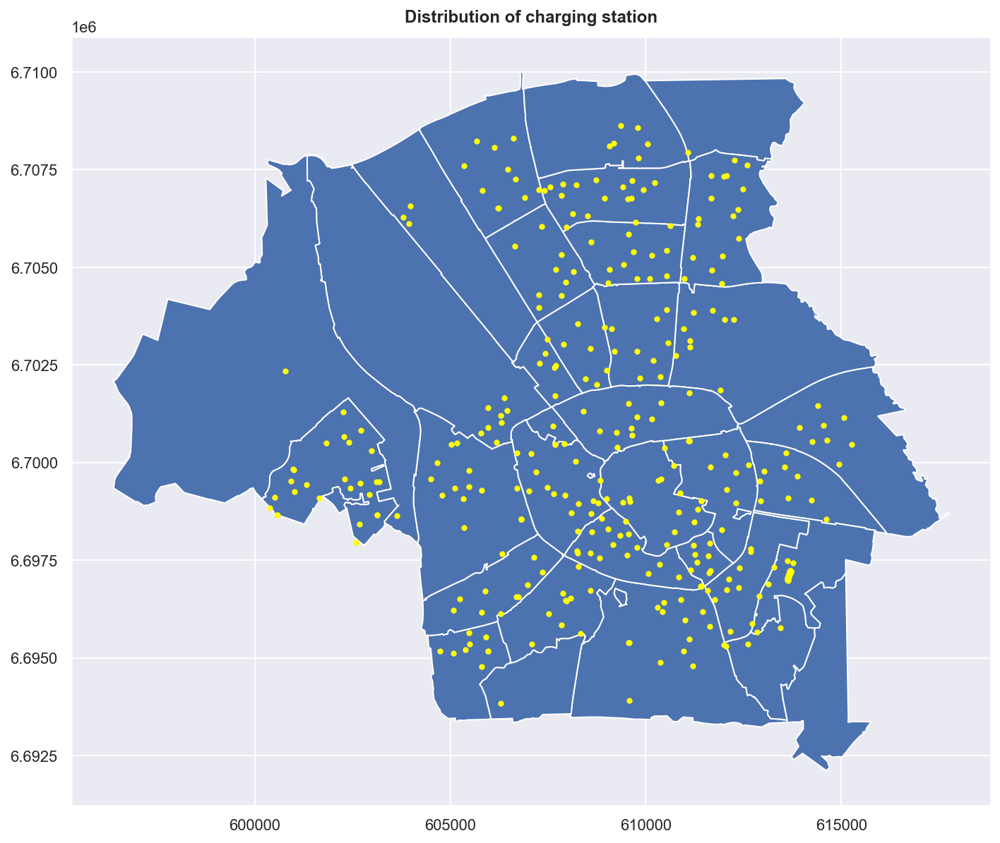

In [532]:
fig, ax = plt.subplots(figsize=(10, 10))
zipcode_area_gdf.plot(ax=ax)
charging_station_gdf.plot(markersize=10, ax=ax, color='yellow')

plt.title("Distribution of charging station")
plt.show()

Distribution of parking spot in each postcode

<AxesSubplot: >

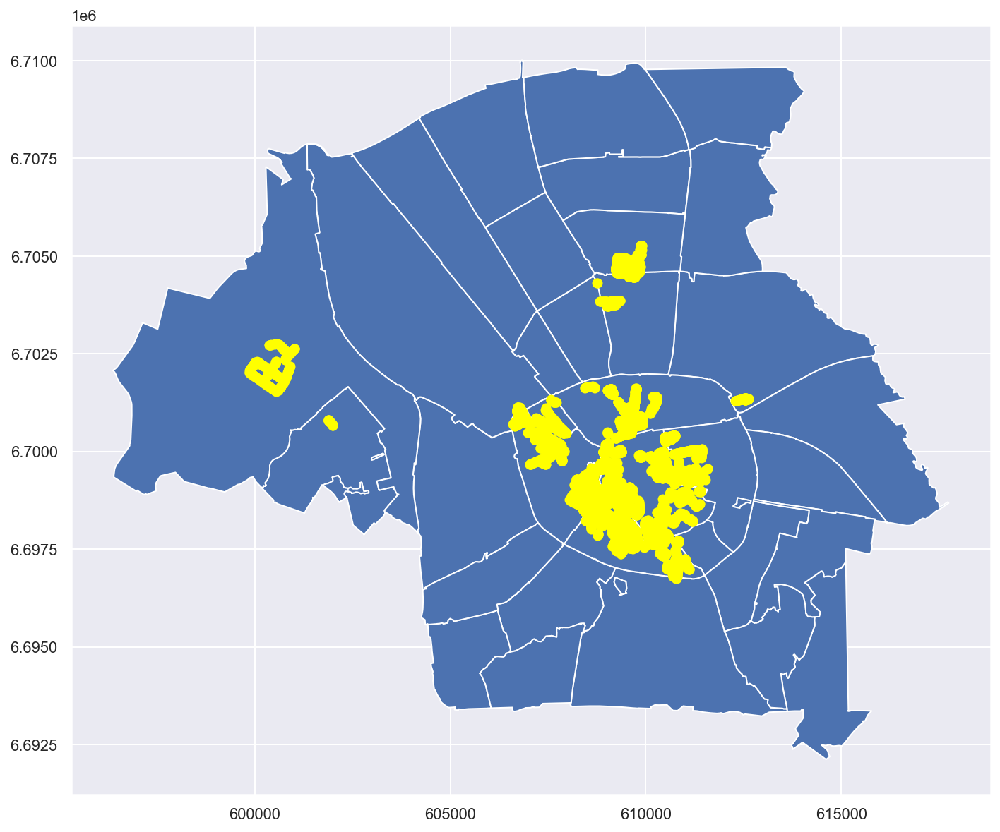

In [533]:
fig, ax = plt.subplots(figsize=(10, 10))

zipcode_area_gdf.plot(ax=ax)
parking_spot_gdf.plot(ax=ax, color='yellow')

Distribution of trees in each postcode

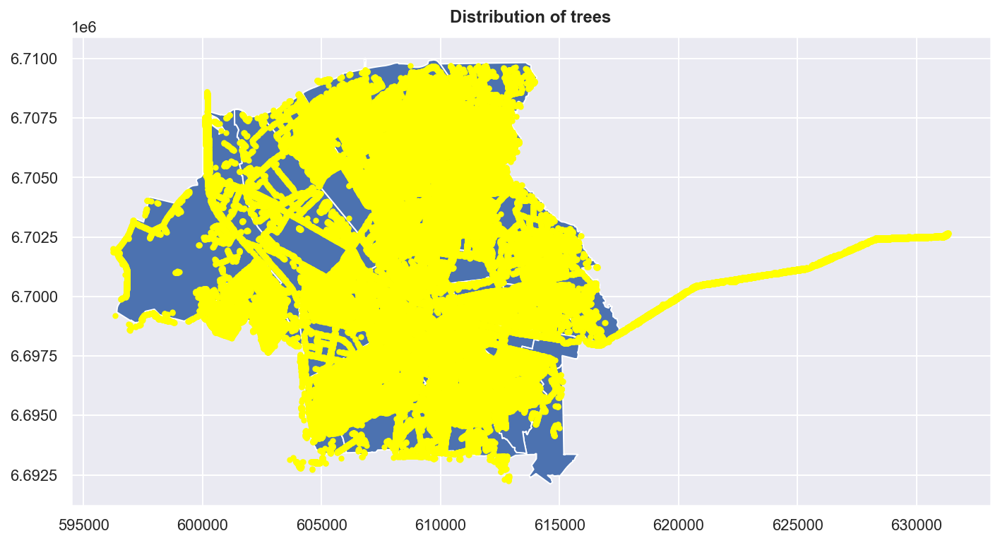

In [534]:
fig, ax = plt.subplots(figsize=(10, 10))
zipcode_area_gdf.plot(ax=ax)
trees_gdf.plot(markersize=10, ax=ax, color='yellow')

plt.title("Distribution of trees")
plt.show()

Distribution of green area in each postcode

<AxesSubplot: >

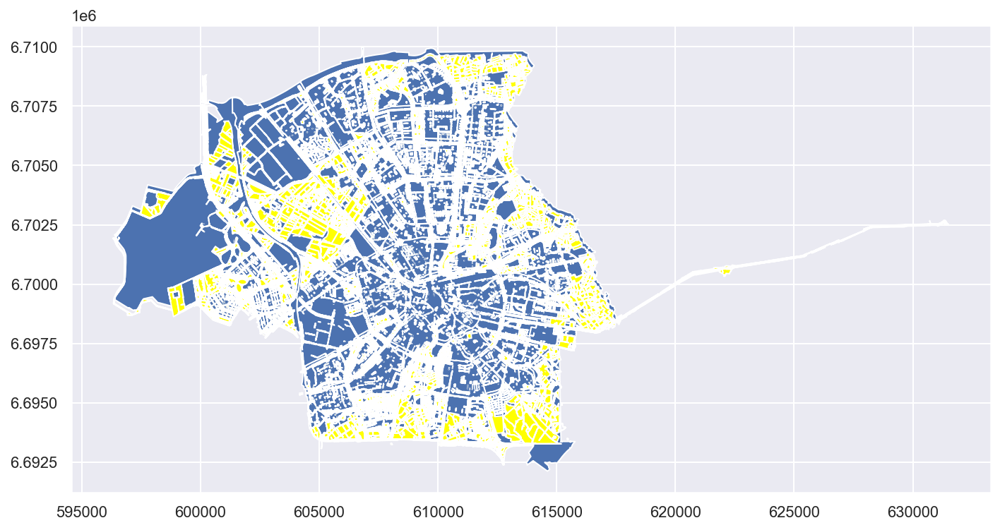

In [535]:
fig, ax = plt.subplots(figsize=(10, 10))

zipcode_area_gdf.plot(ax=ax)
green_areas_gdf.plot(ax=ax, color='yellow')

### Cleaning Researched Datasets

In [536]:
#Charging Station
charging_station_gdf['val'] = 1
pointsInPolygon = gpd.sjoin(charging_station_gdf, zipcode_area_gdf, how="inner", predicate='intersects')
charging_station_per_area_df = pointsInPolygon.groupby('pc4_code').val.sum().to_frame()
charging_station_per_area_df = charging_station_per_area_df.rename(columns={0: "total"})
charging_station_per_area_df.to_csv('./datasets/others/total_charging_station_per_area.csv', index=True)

In [537]:
#Parking Spots
parking_spot_gdf['val'] = 1
pointsInPolygon = gpd.sjoin(parking_spot_gdf, zipcode_area_gdf, how="right", predicate='intersects')
parking_spot_per_area = pointsInPolygon.groupby('pc4_code').val.sum().to_frame()
parking_spot_per_area = parking_spot_per_area.rename(columns={0: "total"})
parking_spot_per_area.to_csv('./datasets/others/total_parking_spot_per_area.csv', index=True)

In [538]:
#Trees
trees_gdf['val'] = 1
pointsInPolygon = gpd.sjoin(trees_gdf, zipcode_area_gdf, how="inner", predicate='intersects')
trees_per_area_df = pointsInPolygon.groupby('pc4_code').val.sum().to_frame()
trees_per_area_df = trees_per_area_df.rename(columns={0: "total"})
trees_per_area_df.to_csv('./datasets/others/total_trees_per_area.csv', index=True)

In [539]:
#Green Area
green_areas_gdf['val'] = 1
pointsInPolygon = gpd.sjoin(green_areas_gdf, zipcode_area_gdf, how="inner", predicate='intersects')
green_areas_per_area = pointsInPolygon.groupby('pc4_code').val.sum().to_frame()
green_areas_per_area = green_areas_per_area.rename(columns={0: "total"})
green_areas_per_area.to_csv('./datasets/others/total_green_areas_per_area.csv', index=True)

# Forecasting

Set Matplotlib defaults

In [540]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)
%config InlineBackend.figure_format = 'retina'


def plot_multistep(y, every=1, ax=None, palette_kwargs=None):
    palette_kwargs_ = dict(palette='husl', n_colors=16, desat=None)
    if palette_kwargs is not None:
        palette_kwargs_.update(palette_kwargs)
    palette = sns.color_palette(**palette_kwargs_)
    if ax is None:
        fig, ax = plt.subplots()
    ax.set_prop_cycle(plt.cycler('color', palette))
    for date, preds in y[::every].iterrows():
        preds.index = pd.period_range(start=date, periods=len(preds))
        preds.plot(ax=ax)
    return ax

/var/folders/7k/8v9qq9hd6kq6pt_9jy96nn6m0000gn/T/ipykernel_13733/281337124.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


Retrieve the dataset and set index as the date.

In [541]:
data_dir = Path("./datasets/others")
merge_data = pd.read_csv(data_dir / "merge-date.csv")

merge_data.set_index(
    pd.PeriodIndex(merge_data.date, freq="h"),
    inplace=True,
)

Group the data by postal code.

In [542]:
merge_data = merge_data[['PC4','pm10','pm2.5','no','no2','so2']]
merge_data_per_zip = dict(tuple(merge_data.groupby('PC4')))

Choose the postal codes that would be used.

In [543]:
merge_data_pc_industrial = merge_data_per_zip[5651]
merge_data_pc_center = merge_data_per_zip[5611]
merge_data_pc_residential =  merge_data_per_zip[5654]

Select the specific dates to use for training and testing data.

In [544]:
startDate = '2021-09-25'
endDate = '2021-09-30'

merge_data_pc_industrial = merge_data_pc_industrial[(merge_data_pc_industrial.index >= startDate) & (merge_data_pc_industrial.index <= endDate)]
merge_data_pc_residential = merge_data_pc_residential[(merge_data_pc_residential.index >= startDate) & (merge_data_pc_residential.index <= endDate)]
merge_data_pc_center = merge_data_pc_center[(merge_data_pc_center.index >= startDate) & (merge_data_pc_center.index <= endDate)]

Create lags and steps for forecasting.

In [545]:
def make_lags(ts, lags, lead_time=1):
    return pd.concat(
        {
            f'y_lag_{i}': ts.shift(i)
            for i in range(lead_time, lags + lead_time)
        },
        axis=1)

def make_multistep_target(ts, steps):
    return pd.concat(
        {f'y_step_{i + 1}': ts.shift(-i)
         for i in range(steps)},
        axis=1)

## Industrial Area

### PM10

Specify the number of lags and steps to be used.

In [546]:
y = merge_data_pc_industrial['pm10'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

Split the data into traing and testing data, using the MultiOutputRegressor as the model.

In [547]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Graph the train and test data.

Train RMSE: 0.00
Test RMSE: 6.69


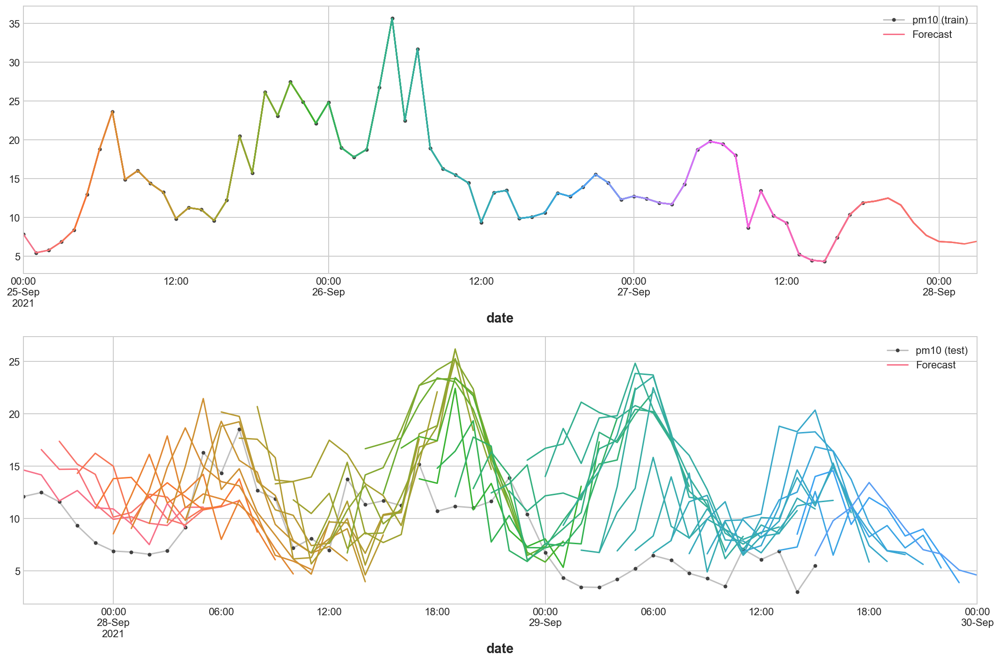

In [548]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['pm10'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['pm10 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['pm10'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['pm10 (test)', 'Forecast'])

Split the data into traing and testing data, using the LinearRegression as the model.

In [549]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = LinearRegression()
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)
y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Graph the trained data and forecasting data.

Train RMSE: 4.57
Test RMSE: 5.81


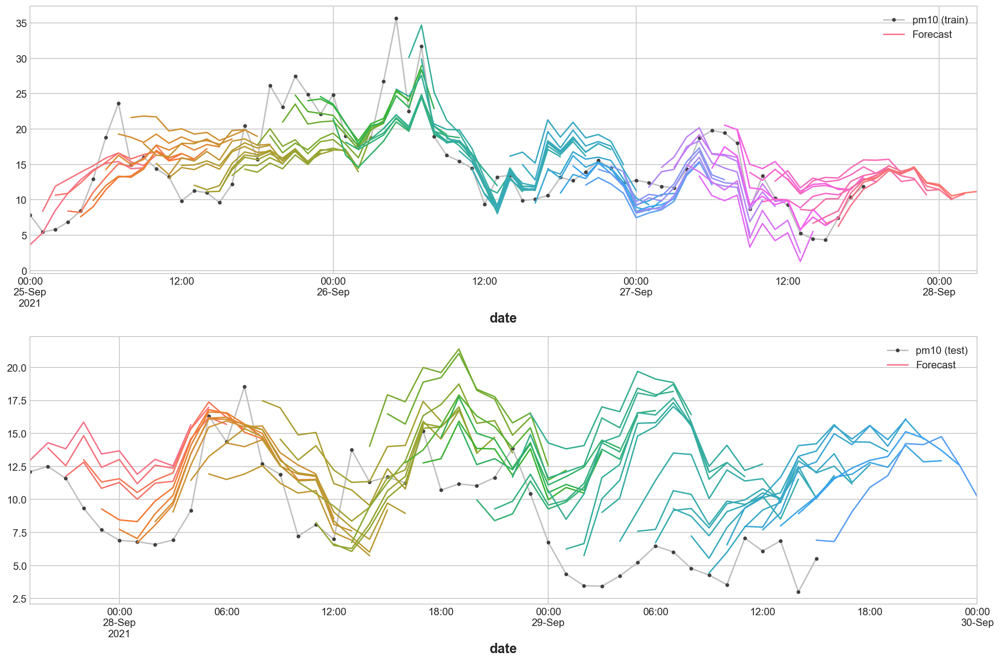

In [550]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['pm10'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['pm10 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['pm10'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['pm10 (test)', 'Forecast'])

Conclusion

Multi-Linear regression can forecast many time steps at once. The number of neurons in the final output layer determines how many steps the model can predict. Each neuron in the output layer is responsible for predicting a different time step in the future. Providing a sequence of input data followed by the corresponding sequence of output data is needed to train the model. If the prediction for the next 10 days is wanted, then historical data of 50 days needs to be inputted as well as the output data for the next 10 days. The model will then learn to map the input sequence to the output sequence, so that it can make predictions for multiple time steps in the future based on the input data.
Multivariate forecasting models take into account multiple input variables, such as historical time series data and additional features like moving averages or momentum indicators, to improve the accuracy of their predictions. The idea is that these various variables can help the model identify patterns in the data that suggest future price movements.

XGBoost is an open-source library that provides an efficient and effective implementation of the gradient boosting algorithm which can be used for predicting continuous target variable. It can be used directly for regression predictive modeling.
Gradient boosting refers to a class of ensemble machine learning algorithms that can be used for classification or regression predictive modeling problems. Ensembles are constructed from decision tree models. Trees are added one at a time to the ensemble and fit to correct the prediction errors made by prior models. This is a type of ensemble machine learning model referred to as boosting. Models are fit using any arbitrary differentiable loss function and gradient descent optimization algorithm. This gives the technique its name, “gradient boosting,” as the loss gradient is minimized as the model is fit, much like a neural network.

It can also be seen that the Linear Regression Model has a error margin while the Multi Linear Regression does not. This also plays in the role of using the Multi Linear Regression Model instead of the Linear Regression Model.

### PM 2.5

Specify the number of lags and steps to be used.

In [551]:
y = merge_data_pc_industrial['pm2.5'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

Split the data into traing and testing data, using the MultiOutputRegressor as the model.

In [552]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Graph the trained data and forecasting data.

Train RMSE: 0.00
Test RMSE: 4.71


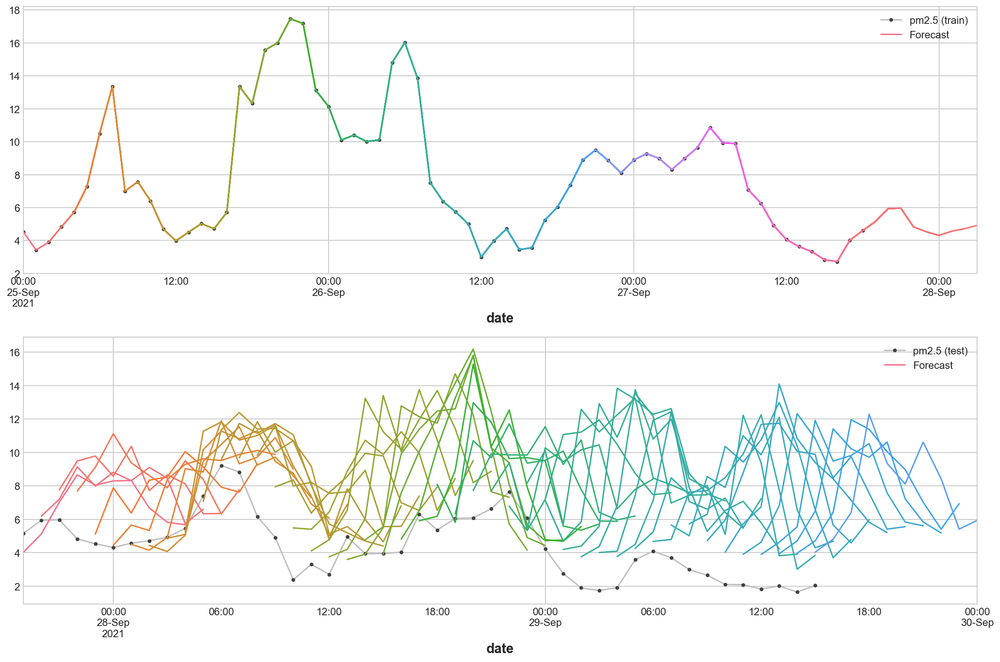

In [553]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['pm2.5'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['pm2.5 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['pm2.5'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['pm2.5 (test)', 'Forecast'])

### NO 

Specify the number of lags and steps to be used.

In [554]:
y = merge_data_pc_industrial['no'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

Split the data into traing and testing data, using the MultiOutputRegressor as the model.

In [555]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Graph the trained data and forecasting data.

Train RMSE: 0.00
Test RMSE: 7.26


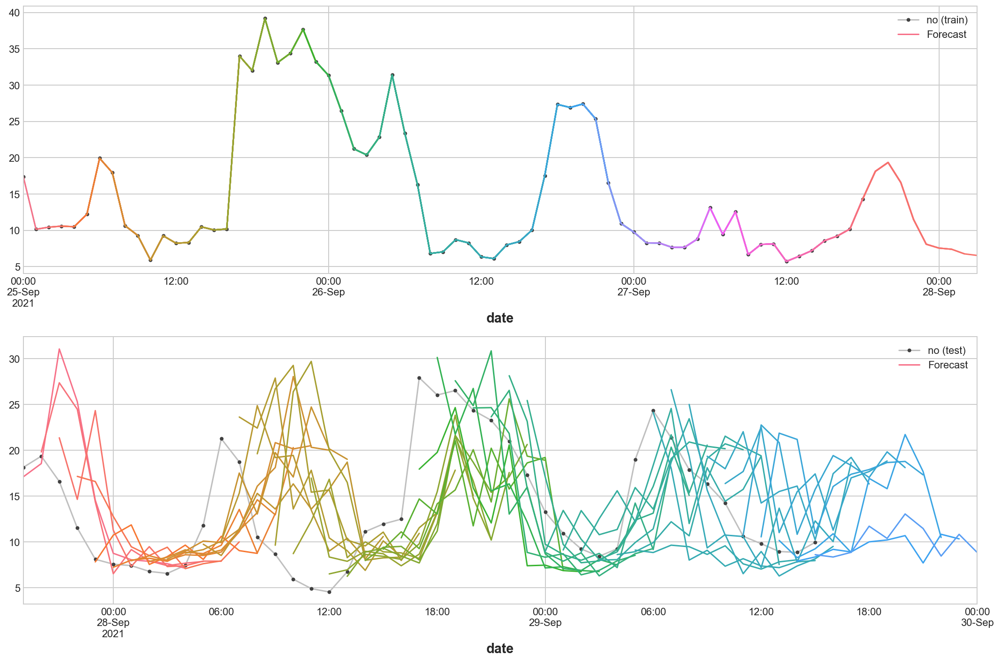

In [556]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['no'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['no (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['no'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['no (test)', 'Forecast'])

### NO2

Specify the number of lags and steps to be used.

In [557]:
y = merge_data_pc_industrial['no2'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

Split the data into traing and testing data, using the MultiOutputRegressor as the model.

In [558]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Graph the trained data and forecasting data.

Train RMSE: 0.00
Test RMSE: 11.31


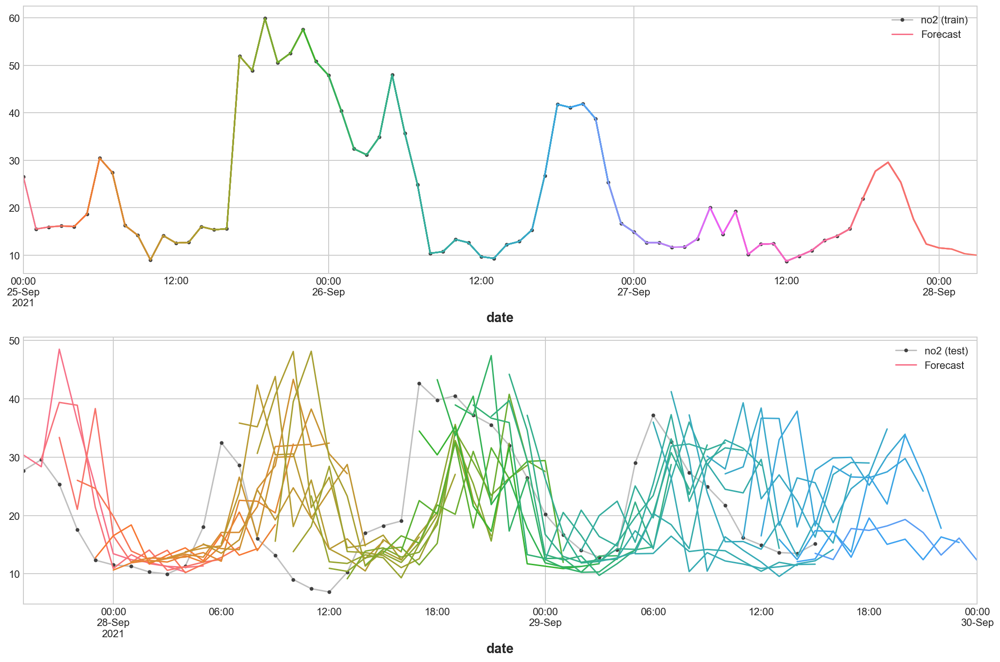

In [559]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['no2'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['no2 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['no2'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['no2 (test)', 'Forecast'])

### SO2

Specify the number of lags and steps to be used.

In [560]:
y = merge_data_pc_industrial['so2'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

Split the data into traing and testing data, using the MultiOutputRegressor as the model.

In [561]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Graph the trained data and forecasting data.

Train RMSE: 0.00
Test RMSE: 2.51


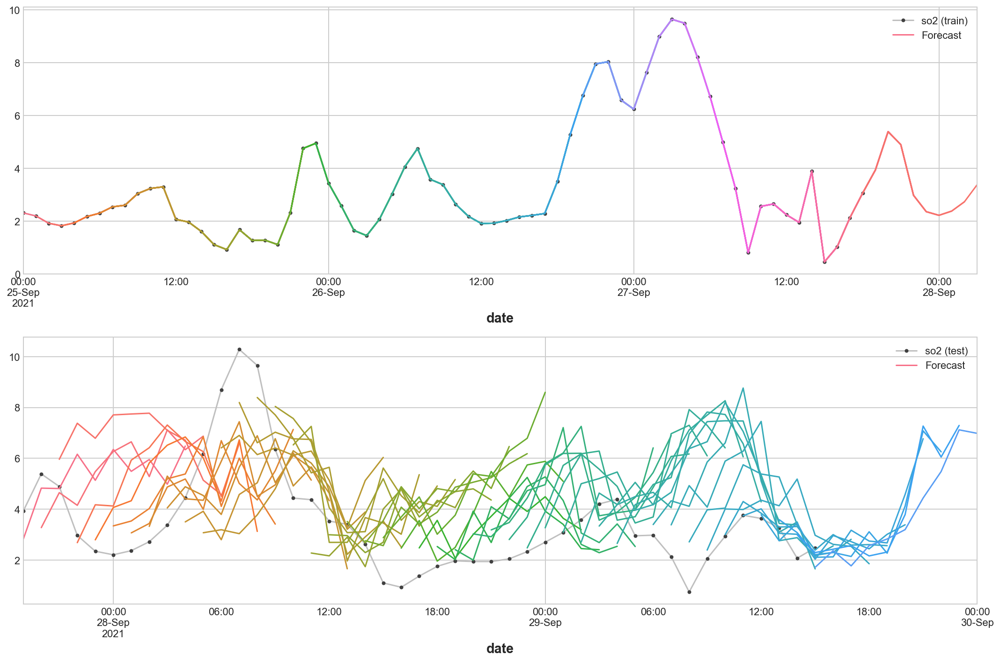

In [562]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['so2'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['so2 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['so2'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['so2 (test)', 'Forecast'])

## Residential Area

### PM 10

In [563]:
y = merge_data_pc_residential['pm10'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [564]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)


Train RMSE: 0.00
Test RMSE: 5.75


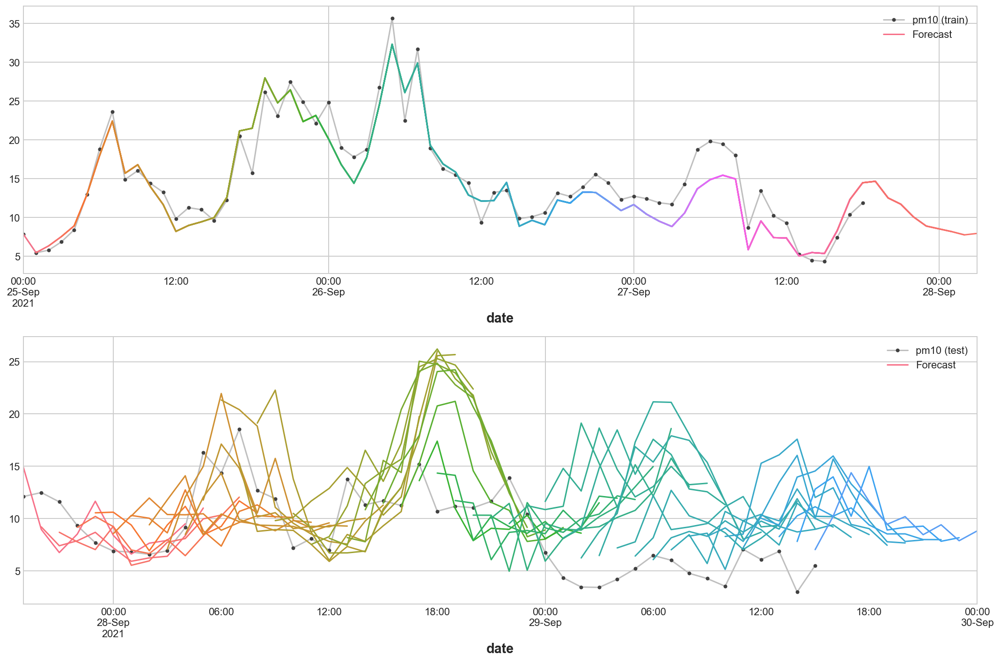

In [565]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['pm10'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['pm10 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['pm10'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['pm10 (test)', 'Forecast'])

### PM 2.5

In [566]:
y = merge_data_pc_residential['pm2.5'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [567]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 3.23


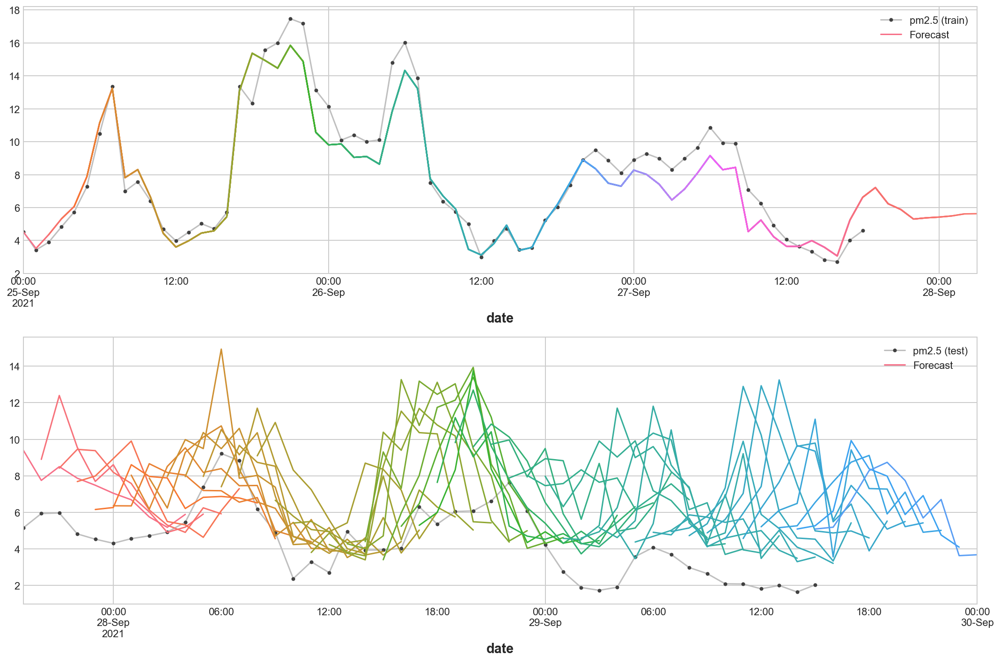

In [568]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['pm2.5'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['pm2.5 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['pm2.5'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['pm2.5 (test)', 'Forecast'])

### NO

In [569]:
y = merge_data_pc_residential['no'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [570]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 5.32


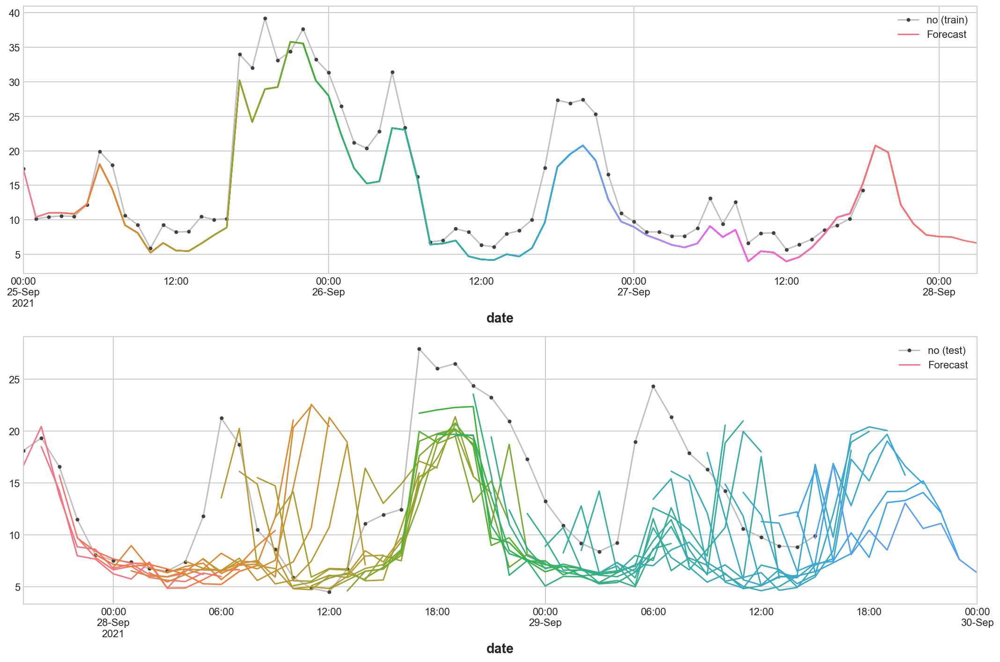

In [571]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['no'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['no (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['no'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['no (test)', 'Forecast'])

### NO2

In [572]:
y = merge_data_pc_residential['no2'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [573]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 8.50


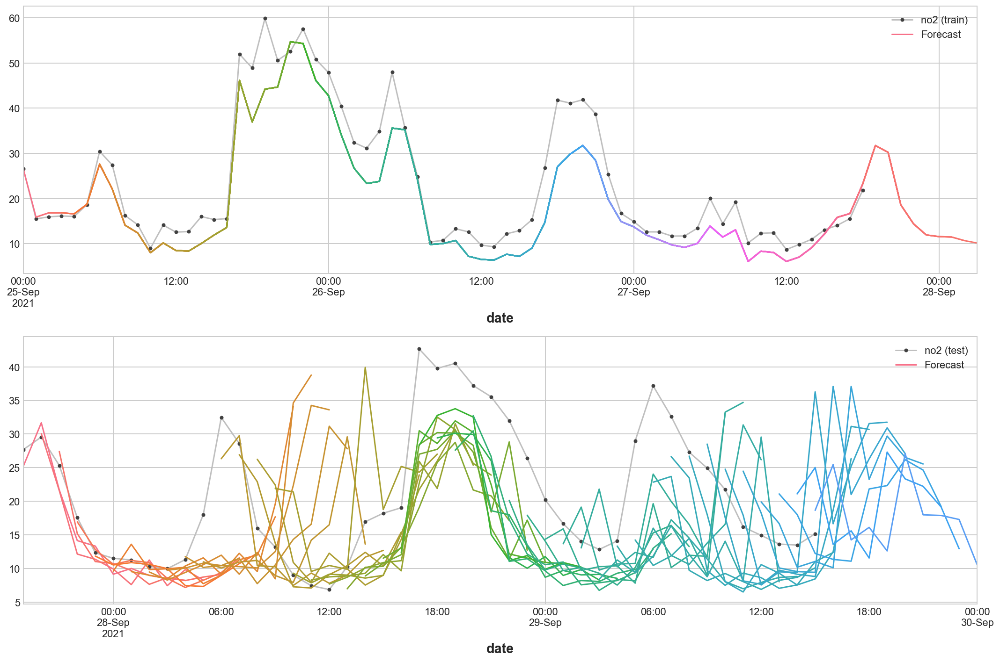

In [574]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['no2'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['no2 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['no2'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['no2 (test)', 'Forecast'])

### SO2

In [575]:
y = merge_data_pc_residential['so2'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [576]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 3.40


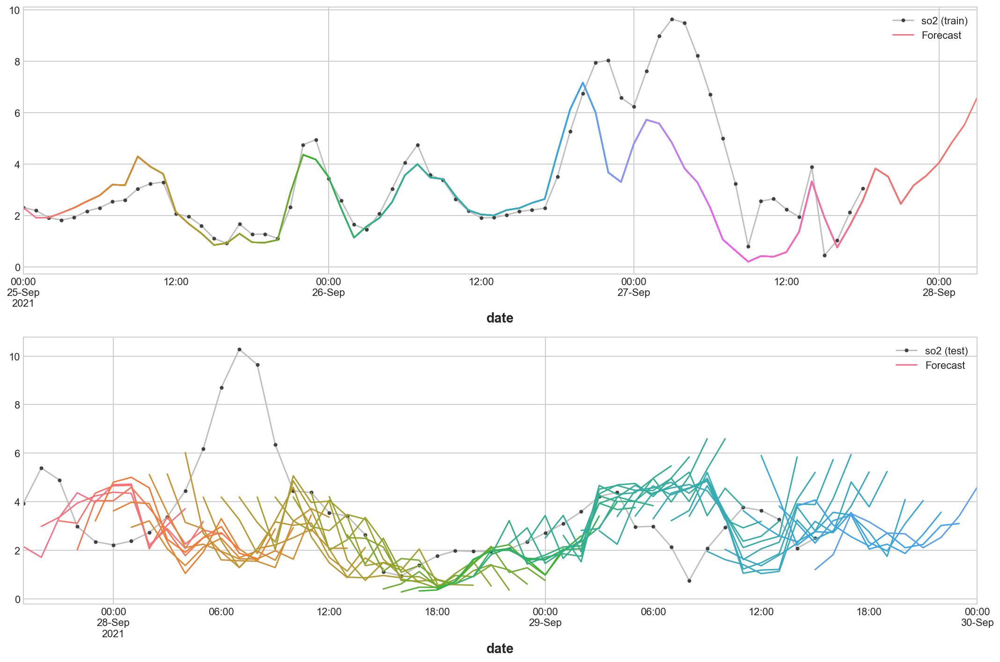

In [577]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['so2'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['so2 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['so2'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['so2 (test)', 'Forecast'])

## City Center

### PM 10

In [578]:
y = merge_data_pc_center['pm10'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [579]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 5.51


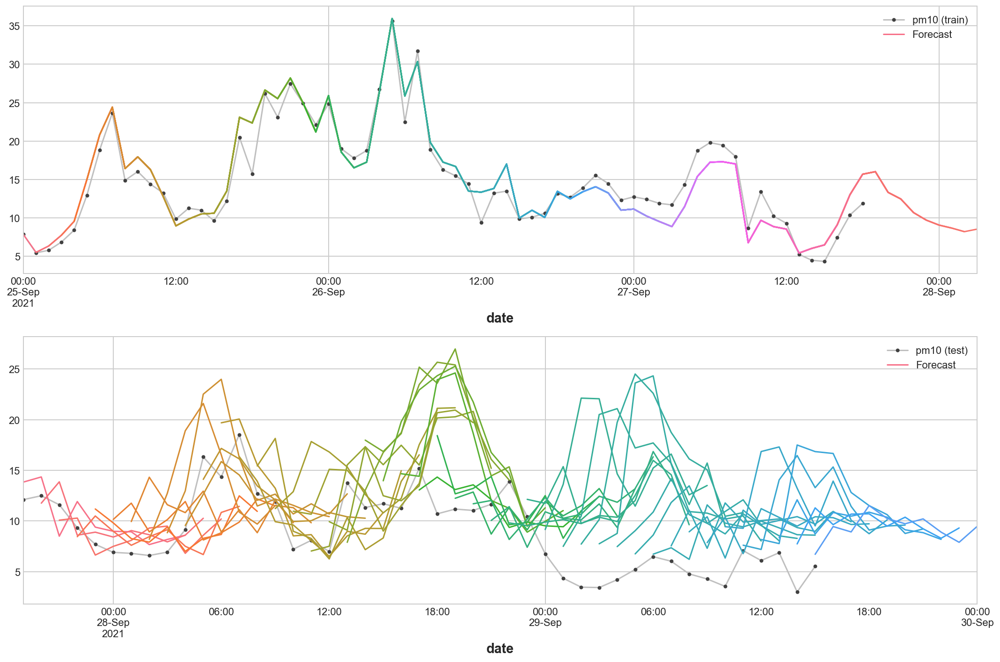

In [580]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['pm10'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['pm10 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['pm10'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['pm10 (test)', 'Forecast'])

### PM 2.5

In [581]:
y = merge_data_pc_center['pm2.5'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [582]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 3.34


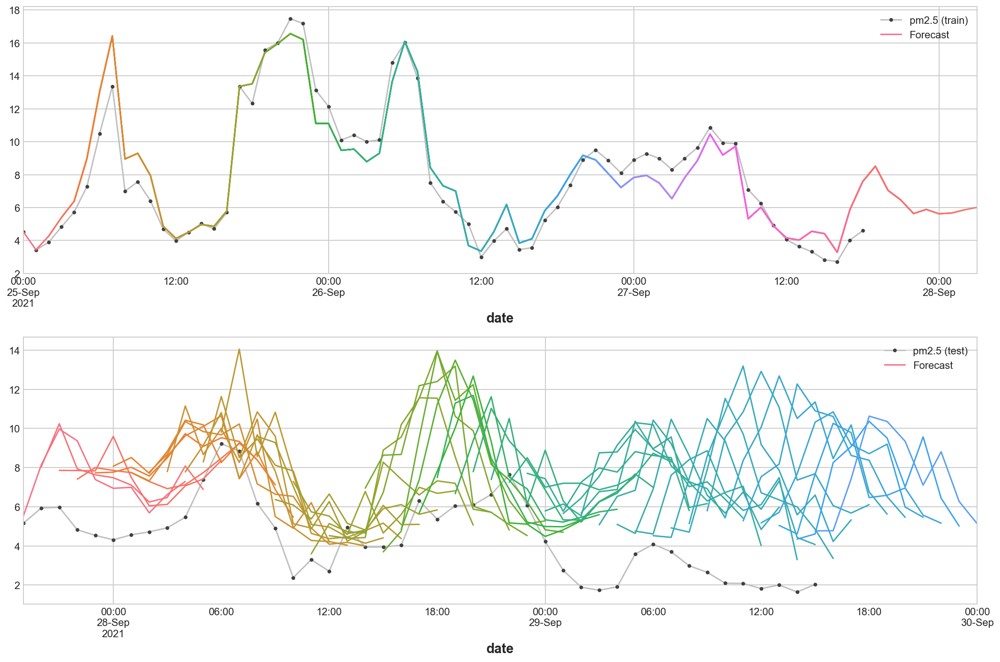

In [583]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['pm2.5'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['pm2.5 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['pm2.5'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['pm2.5 (test)', 'Forecast'])

### NO

In [584]:
y = merge_data_pc_center['no'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [585]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 5.59


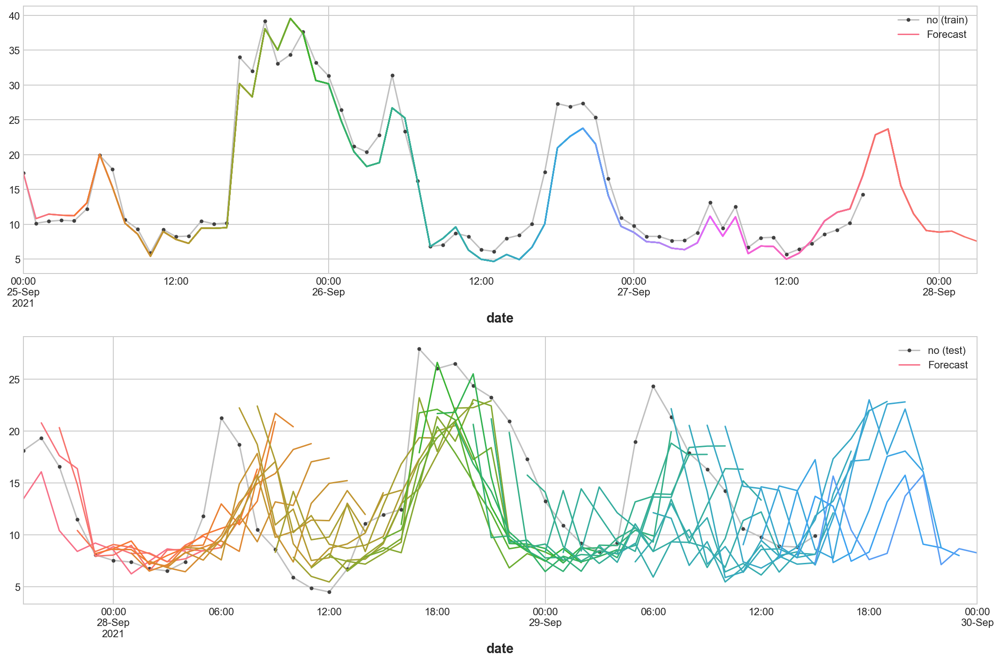

In [586]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['no'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['no (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['no'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['no (test)', 'Forecast'])

### NO2

In [587]:
y = merge_data_pc_center['no2'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [588]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 8.64


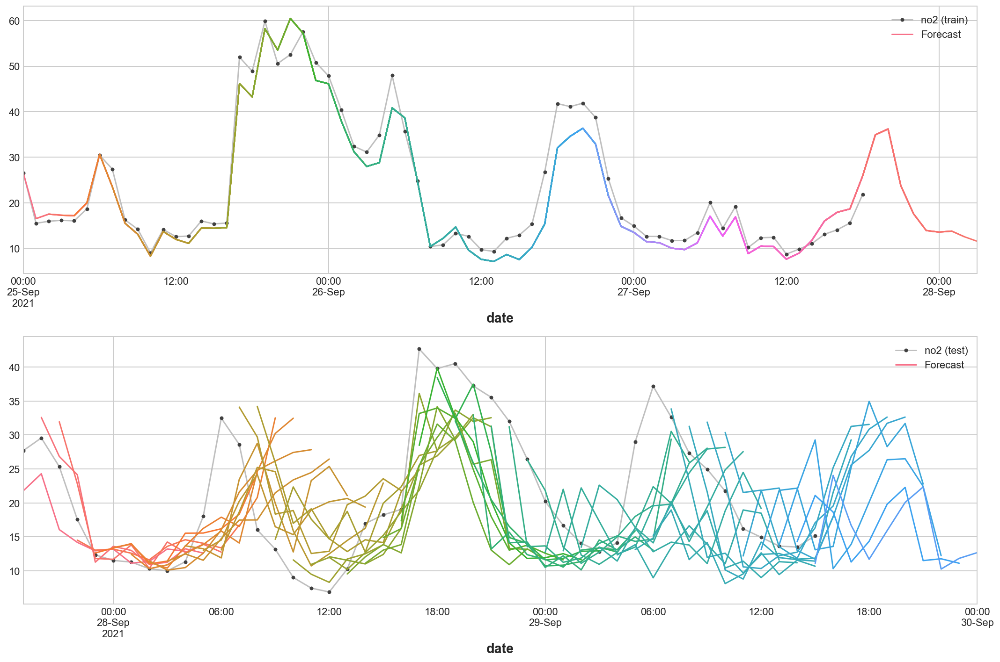

In [589]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['no2'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['no2 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['no2'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['no2 (test)', 'Forecast'])

### SO2

In [590]:
y = merge_data_pc_center['so2'].copy()
X = make_lags(y, lags=24).fillna(0.0)

y = make_multistep_target(y, steps=10).dropna()
y, X = y.align(X, join='inner', axis=0)

In [591]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)

y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

Train RMSE: 0.00
Test RMSE: 3.50


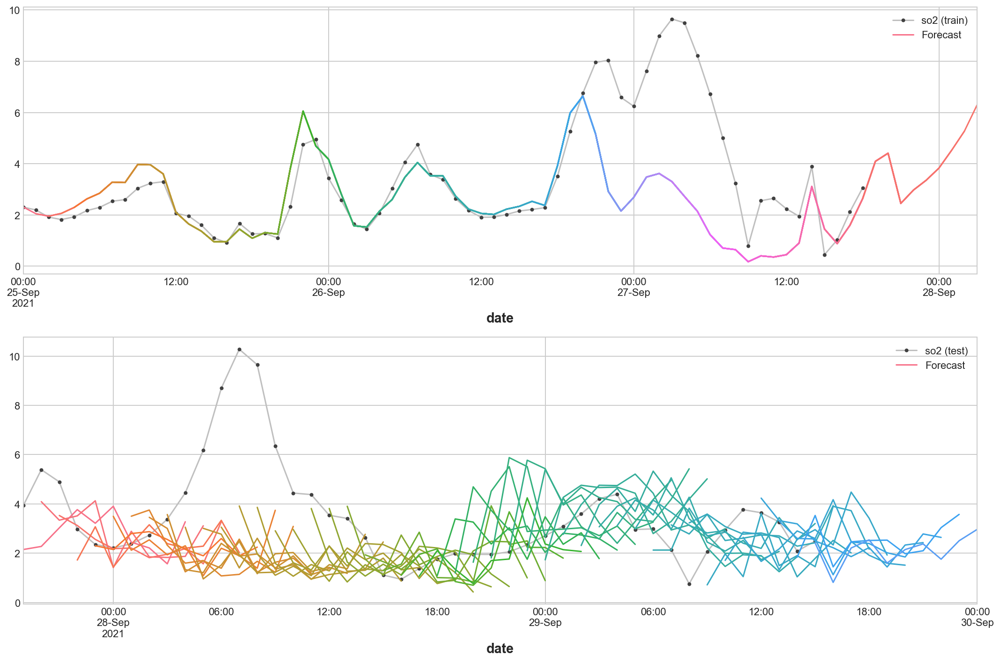

In [592]:
train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print((f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}"))

palette = dict(palette='husl', n_colors=64)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1 = merge_data_pc_industrial['so2'][y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_ = ax1.legend(['so2 (train)', 'Forecast'])

ax2 = merge_data_pc_industrial['so2'][y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_ = ax2.legend(['so2 (test)', 'Forecast'])